In [1]:
import pickle
import json
import os
import re
import sys
from copy import deepcopy
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import skimage
import tifffile
import yaml
from einops import rearrange, repeat
from pydantic_extra_types.color import Color

In [2]:
import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42

In [3]:
%load_ext autoreload

In [4]:
%autoreload 2

In [5]:
from mushroom.mushroom import Mushroom, DEFAULT_CONFIG
import mushroom.utils as utils
import mushroom.visualization.utils as vis_utils
import mushroom.visualization.tiling_utils as tiling_utils
import mushroom.data.multiplex as multiplex
import mushroom.data.visium as visium
import mushroom.data.xenium as xenium
import mushroom.data.cosmx as cosmx

In [6]:
source_root = '/diskmnt/Projects/Users/estorrs/mushroom/data'
target_root = '/data/estorrs/mushroom/data'

In [7]:
run_dir = '/data/estorrs/mushroom/data/projects/submission_v1'

In [8]:
def alter_filesystem(config, source_root, target_root):
    for entry in config['sections']:
        for mapping in entry['data']:
            mapping['filepath'] = mapping['filepath'].replace(source_root, target_root)
        
    return config

In [9]:
# case = 'HT913Z1'
# case = 'HT891Z1'
case = 'HT704B1'
# case = 'HT206B1'
# case = 'HT397B1'
# case = 'HT413C1-Th1k4A1'

In [10]:
project_dir = f'/data/estorrs/mushroom/data/projects/submission_v1/{case}'

In [11]:
config = yaml.safe_load(open(os.path.join(project_dir, 'registered', 'metadata.yaml')))
config = alter_filesystem(config, source_root, target_root)
config

{'resolution': 1.0,
 'sections': [{'data': [{'dtype': 'xenium',
     'filepath': '/data/estorrs/mushroom/data/projects/submission_v1/HT704B1/registered/s0_HT704B1-U1_xenium.h5ad'}],
   'position': 0,
   'sid': 'HT704B1-U1'},
  {'data': [{'dtype': 'multiplex',
     'filepath': '/data/estorrs/mushroom/data/projects/submission_v1/HT704B1/registered/s1_HT704B1-U11_multiplex.ome.tiff'}],
   'position': 50,
   'sid': 'HT704B1-U11'},
  {'data': [{'dtype': 'he',
     'filepath': '/data/estorrs/mushroom/data/projects/submission_v1/HT704B1/registered/s2_HT704B1-U12_he.tif'}],
   'position': 55,
   'sid': 'HT704B1-U12'},
  {'data': [{'dtype': 'cosmx',
     'filepath': '/data/estorrs/mushroom/data/projects/submission_v1/HT704B1/registered/s3_HT704B1-U14_cosmx.h5ad'}],
   'position': 65,
   'sid': 'HT704B1-U14'},
  {'data': [{'dtype': 'he',
     'filepath': '/data/estorrs/mushroom/data/projects/submission_v1/HT704B1/registered/s4_HT704B1-U15_he.tif'}],
   'position': 70,
   'sid': 'HT704B1-U15'},
 

In [12]:
fps = [entry['data'][0]['filepath'] for entry in config['sections']
                 if entry['data'][0]['dtype']=='multiplex']
multiplex_channels = multiplex.get_common_channels(fps)
multiplex_channels

['BCA1',
 'CD163',
 'CD20',
 'CD31',
 'CD39',
 'CD3e',
 'CD4 (D)',
 'CD45 (D)',
 'CD68',
 'CD8',
 'CK14 (D)',
 'COX6C (D)',
 'CTLA4 (D)',
 'DAPI',
 'E-cadherin',
 'FOXP3',
 'GATA3',
 'GLUT1 (D)',
 'Granzyme B',
 'HER2 (D)',
 'HIF1a',
 'HLA-DR',
 'Keratin 5',
 'Ki67',
 'MGP (D)',
 'MLPH',
 'PD-1',
 'PLAT/tPA (D)',
 'PR (D)',
 'Pan-Cytokeratin',
 'Podoplanin (D)',
 'SLC39A6 (D)',
 'SMA (D)',
 'TCF-1',
 'TFF1 (D)',
 'Vimentin',
 'cd11b',
 'ckit-(D)']

In [13]:
case_to_multiplex_view_settings = {
    'HT913Z1': [
        {
            'channel': 'E-Cadherin',
            'color': 'red',
            'min_value': 15,
            'max_value': 100,
            'gamma': 1.
        },
        {
            'channel': 'HLA-DR',
            'color': 'yellow',
            'min_value': 15,
            'max_value': 255,
            'gamma': 1.
        },
        {
            'channel': 'CK5',
            'color': 'white',
            'min_value': 15,
            'max_value': 255,
            'gamma': 1.
        },
        {
            'channel': 'CD3e',
            'color': 'green',
            'min_value': 20,
            'max_value': 75,
            'gamma': 1.
        },
        {
            'channel': 'CD68',
            'color': 'cyan',
            'min_value': 15,
            'max_value': 255,
            'gamma': 1.
        },
    ],
    'HT891Z1': [
        {
            'channel': 'E-Cadherin',
            'color': 'red',
            'min_value': 15,
            'max_value': 100,
            'gamma': 1.
        },
        {
            'channel': 'HLA-DR',
            'color': 'yellow',
            'min_value': 15,
            'max_value': 255,
            'gamma': 1.
        },
        {
            'channel': 'CK5',
            'color': 'white',
            'min_value': 15,
            'max_value': 255,
            'gamma': 1.
        },
        {
            'channel': 'CD3e',
            'color': 'green',
            'min_value': 20,
            'max_value': 255,
            'gamma': 1.
        },
        {
            'channel': 'CD68',
            'color': 'cyan',
            'min_value': 15,
            'max_value': 255,
            'gamma': 1.
        },
    ],
    'HT704B1': [
        {
            'channel': 'E-cadherin',
            'color': 'red',
            'min_value': 15,
            'max_value': 255,
            'gamma': 1.
        },
        {
            'channel': 'HLA-DR',
            'color': 'yellow',
            'min_value': 15,
            'max_value': 255,
            'gamma': 1.
        },
        {
            'channel': 'Keratin 5',
            'color': 'white',
            'min_value': 15,
            'max_value': 255,
            'gamma': 1.
        },
        {
            'channel': 'CD3e',
            'color': 'green',
            'min_value': 20,
            'max_value': 255,
            'gamma': 1.
        },
        {
            'channel': 'CD68',
            'color': 'cyan',
            'min_value': 15,
            'max_value': 255,
            'gamma': 1.
        },
    ],
    'HT206B1': [
        {
            'channel': 'Pan-Cytokeratin',
            'color': 'red',
            'min_value': 15,
            'max_value': 100,
            'gamma': 1.
        },
        {
            'channel': 'HLA-DR',
            'color': 'yellow',
            'min_value': 15,
            'max_value': 150,
            'gamma': 1.
        },
        {
            'channel': 'SMA (D)',
            'color': 'white',
            'min_value': 15,
            'max_value': 150,
            'gamma': 1.
        },
        {
            'channel': 'Podoplanin (D)',
            'color': 'white',
            'min_value': 15,
            'max_value': 65,
            'gamma': 1.
        },
        {
            'channel': 'CD4 (D)',
            'color': 'green',
            'min_value': 20,
            'max_value': 165,
            'gamma': 1.
        },
        {
            'channel': 'CD45 (D)',
            'color': 'cyan',
            'min_value': 40,
            'max_value': 130,
            'gamma': 1.
        },
    ],
    'HT397B1': [
        {
            'channel': 'Pan-Cytokeratin',
            'color': 'red',
            'min_value': 15,
            'max_value': 255,
            'gamma': 1.
        },
        {
            'channel': 'HLA-DR',
            'color': 'yellow',
            'min_value': 20,
            'max_value': 255,
            'gamma': 1.
        },
        {
            'channel': 'Keratin 14',
            'color': 'white',
            'min_value': 25,
            'max_value': 100,
            'gamma': 1.
        },
        {
            'channel': 'CD8',
            'color': 'green',
            'min_value': 10,
            'max_value': 31,
            'gamma': 1.
        },
        {
            'channel': 'CD45 (D)',
            'color': 'cyan',
            'min_value': 15,
            'max_value': 35,
            'gamma': 1.
        },
    ]
}

In [14]:

multiplex_view_settings = case_to_multiplex_view_settings[case]

def get_multiplex_pseudo(fp, view_settings):
    channels = [x['channel'] for x in view_settings]
    colors = [x['color'] for x in view_settings]
    min_values = [x['min_value'] for x in view_settings]
    max_values = [x['max_value'] for x in view_settings]
    gammas = [x['gamma'] for x in view_settings]
    
    channel_to_img = multiplex.extract_ome_tiff(fp, as_dict=True)
    data = np.stack([channel_to_img[x] for x in channels])
    
    rgb = multiplex.to_pseudocolor(
        data,
        colors=colors,
        min_values=min_values,
        max_values=max_values,
        gammas=gammas
    )
    
    rgb *= 255.
    rgb = rgb.astype(np.uint8)
    
    return rgb

In [15]:
XENIUM_FOCUS_SETTINGS = [
    {
        'channel': 'DAPI',
        'color': 'blue',
        'min_value': 0,
        'max_value': 100,
        'gamma': 1.
    },
    {
        'channel': 'ATP1A1/CD45/E-Cadherin',
        'color': 'magenta',
        'min_value': 0,
        'max_value': 100,
        'gamma': 1.
    },
                         {
        'channel': '18S',
        'color': 'yellow',
        'min_value': 0,
        'max_value': 50,
        'gamma': 1.
    },
                         {
        'channel': 'alphaSMA/Vimentin',
        'color': 'green',
        'min_value': 0,
        'max_value': 100,
        'gamma': 1.
    },
]

case_to_xenium_view_settings = {
    'HT913Z1': [
        {
            'channel': 'EPCAM',
            'color': 'red',
            'marker': '.',
        },
        {
            'channel': 'HLA-DQB2',
            'color': 'yellow',
            'marker': 'v',
        },
        {
            'channel': 'TP63',
            'color': 'white',
            'marker': 's',
        },
        {
            'channel': 'KRT5',
            'color': 'white',
            'marker': 's',
        },
        {
            'channel': 'CP',
            'color': 'purple',
            'marker': 'P',
        },
        {
            'channel': 'CD3E',
            'color': 'limegreen',
            'marker': '*',
        },
        {
            'channel': 'CD68',
            'color': 'cyan',
            'marker': 'D',
        },
    ],
    'HT891Z1': [
        {
            'channel': 'EPCAM',
            'color': 'red',
            'marker': '.',
        },
        {
            'channel': 'HLA-DQB2',
            'color': 'yellow',
            'marker': 'v',
        },
        {
            'channel': 'TP63',
            'color': 'white',
            'marker': 's',
        },
        {
            'channel': 'KRT5',
            'color': 'white',
            'marker': 's',
        },
        {
            'channel': 'CP',
            'color': 'purple',
            'marker': 'P',
        },
        {
            'channel': 'CD3E',
            'color': 'limegreen',
            'marker': '*',
        },
        {
            'channel': 'CD68',
            'color': 'cyan',
            'marker': 'D',
        },
    ],
    'HT704B1': [
        {
            'channel': 'EPCAM',
            'color': 'red',
            'marker': '.',
        },
        {
            'channel': 'HLA-DQB2',
            'color': 'yellow',
            'marker': 'v',
        },
        {
            'channel': 'KRT5',
            'color': 'white',
            'marker': 's',
        },
        {
            'channel': 'TP63',
            'color': 'white',
            'marker': 's',
        },
        {
            'channel': 'CD3E',
            'color': 'limegreen',
            'marker': '*',
        },
        {
            'channel': 'CD68',
            'color': 'cyan',
            'marker': 'D',
        },
    ],
    'HT206B1': [
        {
            'channel': 'EPCAM',
            'color': 'red',
            'marker': '.',
        },
        {
            'channel': 'HLA-DQB2',
            'color': 'yellow',
            'marker': 'v',
        },
        {
            'channel': 'ACTA2',
            'color': 'white',
            'marker': 's',
        },
        {
            'channel': 'PDPN',
            'color': 'white',
            'marker': 's',
        },
        {
            'channel': 'CD3E',
            'color': 'limegreen',
            'marker': '*',
        },
        {
            'channel': 'CD68',
            'color': 'cyan',
            'marker': 'D',
        },
    ],
    'HT397B1': [
        {
            'channel': 'EPCAM',
            'color': 'red',
            'marker': '.',
        },
        {
            'channel': 'HLA-DQB2',
            'color': 'yellow',
            'marker': 'v',
        },
        {
            'channel': 'KRT5',
            'color': 'white',
            'marker': 's',
        },
        {
            'channel': 'CD3E',
            'color': 'limegreen',
            'marker': '*',
        },
        {
            'channel': 'CD68',
            'color': 'cyan',
            'marker': 'D',
        },
    ],
}

xenium_view_settings = case_to_xenium_view_settings[case]

def get_xenium_pseudo(morph_fp):
    cs = multiplex.get_ome_tiff_channels(morph_fp)
    if len(cs) == 1: # just nuclei
        channels = ['DAPI']
        colors = ['white']
        min_values = [0.]
        max_values = [100.]
        gammas = [1.]
    else: # multiple channels
        channels = [x['channel'] for x in XENIUM_FOCUS_SETTINGS]
        colors = [x['color'] for x in XENIUM_FOCUS_SETTINGS]
        min_values = [x['min_value'] for x in XENIUM_FOCUS_SETTINGS]
        max_values = [x['max_value'] for x in XENIUM_FOCUS_SETTINGS]
        gammas = [x['gamma'] for x in XENIUM_FOCUS_SETTINGS]
    
    channel_to_img = multiplex.extract_ome_tiff(morph_fp, as_dict=True)
    data = np.stack([channel_to_img[x] for x in channels])
    
    rgb = multiplex.to_pseudocolor(
        data,
        colors=colors,
        min_values=min_values,
        max_values=max_values,
        gammas=gammas
    )
    
    rgb *= 255.
    rgb = rgb.astype(np.uint8)
    
    return rgb

def plot_xenium_pseudo(ax, rgb, transcripts, view_settings, s=.1):
    ax.imshow(rgb)
    
    if not isinstance(transcripts, pd.DataFrame):
        transcripts = pd.read_parquet(transcripts)
        
    pool = set(transcripts['feature_name'])
    for entry in view_settings:
        color = np.asarray(Color(entry['color']).as_rgb_tuple()) / 255.
        channel = entry['channel']
        marker = entry['marker']
        
        if channel in pool:
            small = transcripts[transcripts['feature_name']==channel]
            X = small[['y_location', 'x_location']].values.astype(int)
            ax.scatter(X[:, 1], X[:, 0], color=color, s=s, marker=marker, edgecolors='none')
    return ax

def add_transcripts_to_rgb(rgb, transcripts, xenium_view_settings, pt_scaler=50):
    if not isinstance(transcripts, pd.DataFrame):
        transcripts = pd.read_parquet(transcripts)

    size = (rgb.shape[1] / 1000, rgb.shape[0] / 1000)
    fig, ax = plt.subplots(figsize=(rgb.shape[1] / 1000, rgb.shape[0] / 1000))
    ax.set_axis_off()
    ax = plot_xenium_pseudo(ax, rgb, transcripts, xenium_view_settings, s=size[0] / pt_scaler)
    plt.savefig('temp.tif', bbox_inches='tight', pad_inches=0, dpi=int(1000 * 1.2987411728584588))
    rgb = tifffile.imread('temp.tif')
    os.remove('temp.tif')
    
    if rgb.shape[-1] == 4:
        rgb = rgb[..., :-1]
    
    return rgb



In [16]:
# morph_fp = '/data/estorrs/mushroom/data/projects/submission_v1/HT913Z1/registered/s13_HT913Z1-U21_xenium_morphologyfocus.ome.tiff'
# transcripts_fp = '/data/estorrs/mushroom/data/projects/submission_v1/HT913Z1/registered/s13_HT913Z1-U21_xenium_transcripts.parquet'

# morph_fp = '/data/estorrs/mushroom/data/projects/submission_v1/HT413C1-Th1k4A1/registered/s10_HT413C1-Th1k4A1-U9_xenium_morphologyfocus.ome.tiff'
# transcripts_fp = '/data/estorrs/mushroom/data/projects/submission_v1/HT413C1-Th1k4A1/registered/s10_HT413C1-Th1k4A1-U9_xenium_transcripts.parquet'


In [17]:
target_size = xenium.get_fullres_size(xenium.adata_from_xenium(config['sections'][0]['data'][0]['filepath']))
# target_size = tifffile.imread(config['sections'][1]['data'][0]['filepath']).shape[1:]
# target_size = [int(x * .5) for x in target_size]
target_size

(7250, 9063)

In [18]:
imaris_dir = Path(os.path.join(project_dir, 'imaris'))
imaris_dir.mkdir(parents=True, exist_ok=True)
imaris_dir

PosixPath('/data/estorrs/mushroom/data/projects/submission_v1/HT704B1/imaris')

0 HT704B1-U1
(7250, 9063, 3)
1 HT704B1-U11
(7250, 9063, 3)
2 HT704B1-U12
(7250, 9063, 3)
3 HT704B1-U14
4 HT704B1-U15
(7250, 9063, 3)
5 HT704B1-U17
(7250, 9063, 3)
6 HT704B1-U19
(7250, 9063, 3)
7 HT704B1-U20
(7250, 9063, 3)
8 HT704B1-U22
9 HT704B1-U23
(7250, 9063, 3)
10 HT704B1-U26
(7250, 9063, 3)
11 HT704B1-U27
(7250, 9063, 3)
12 HT704B1-U28
(7250, 9063, 3)
13 HT704B1-U31
(7250, 9063, 3)
14 HT704B1-U33
(7250, 9063, 3)
15 HT704B1-U35
(7250, 9063, 3)
16 HT704B1-U36
(7250, 9063, 3)
17 HT704B1-U39
(7250, 9063, 3)
18 HT704B1-U41
(7250, 9063, 3)
19 HT704B1-U43
(7250, 9063, 3)
20 HT704B1-U44
(7250, 9063, 3)
21 HT704B1-U47
22 HT704B1-U48
(7250, 9063, 3)
23 HT704B1-U50
(7250, 9063, 3)
24 HT704B1-U53
(7250, 9063, 3)
25 HT704B1-U54
(7250, 9063, 3)
26 HT704B1-U56
27 HT704B1-U57
(7250, 9063, 3)
28 HT704B1-U60
(7250, 9063, 3)
29 HT704B1-U61
(7250, 9063, 3)
30 HT704B1-U65
(7250, 9063, 3)
31 HT704B1-U68
(7250, 9063, 3)
32 HT704B1-U69
(7250, 9063, 3)
33 HT704B1-U73
(7250, 9063, 3)
34 HT704B1-U76
(7250,

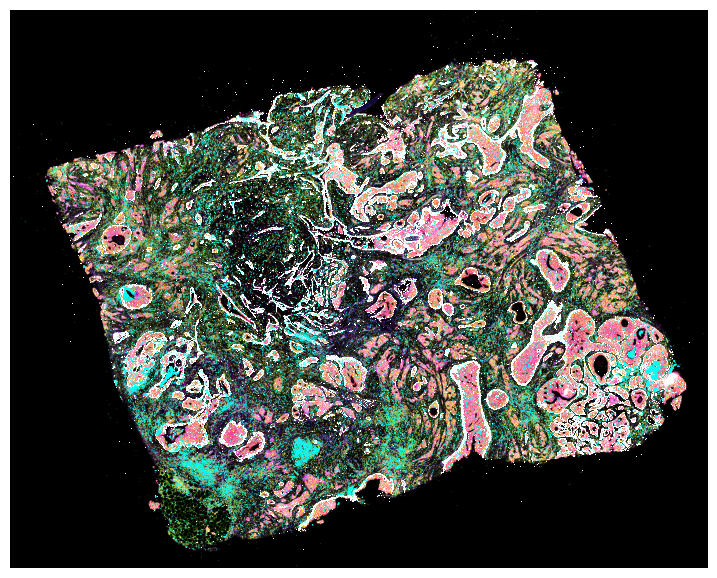

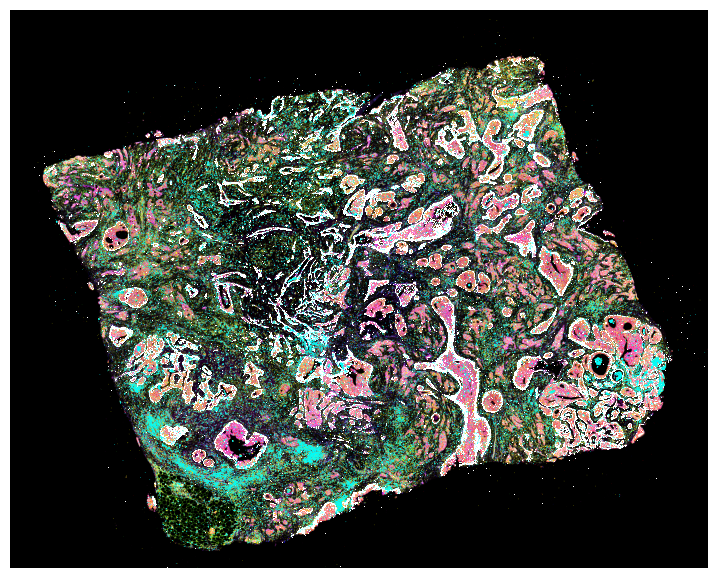

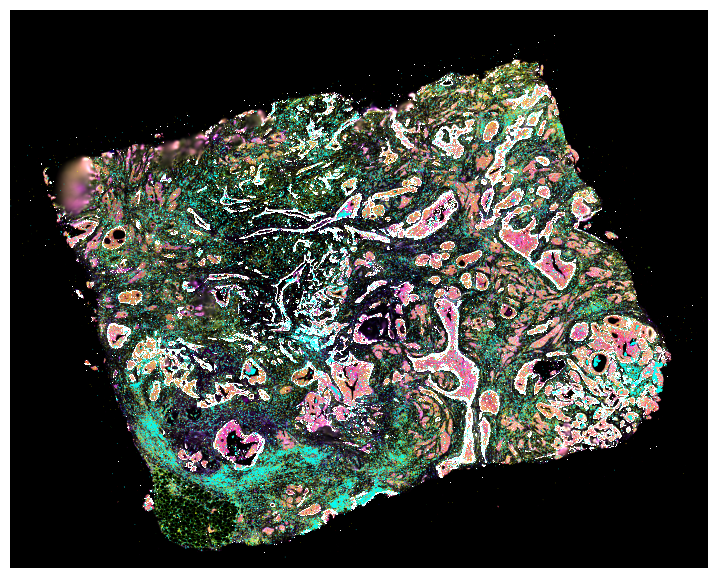

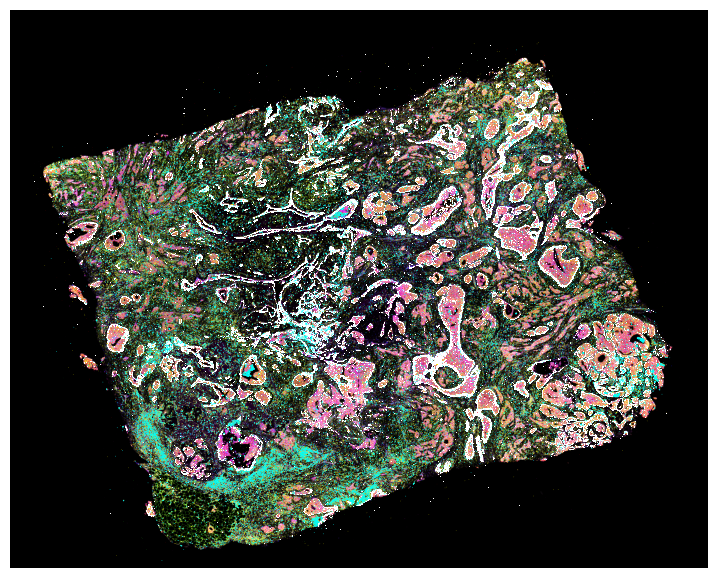

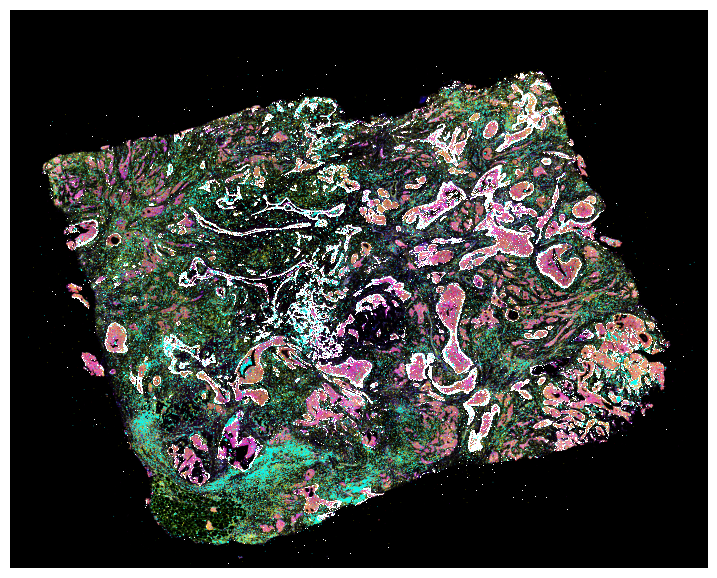

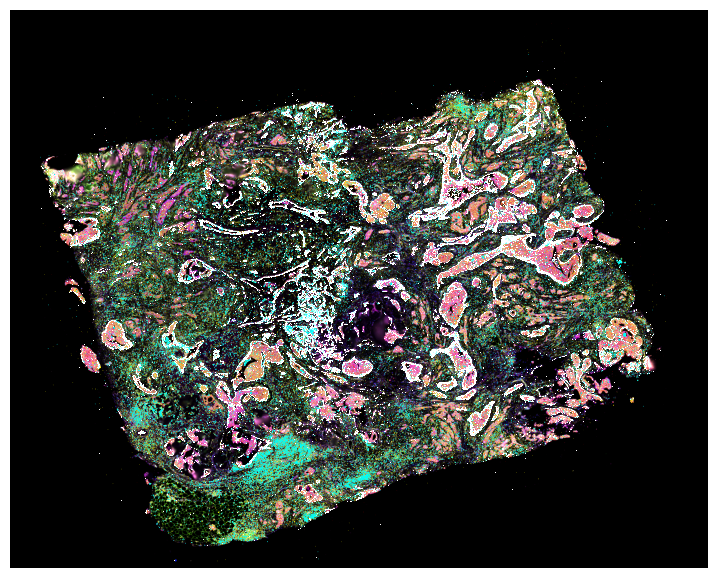

In [19]:
z_rgb_dir = imaris_dir / 'pseudos_rgb_zlabeled'
sids_rgb_dir = imaris_dir / 'pseudos_rgb_sids'

z_rgb_dir.mkdir(parents=True, exist_ok=True)
sids_rgb_dir.mkdir(parents=True, exist_ok=True)

rgbs = []
for i, section in enumerate(config['sections']):
    print(i, section['sid'])
    sid = section['sid']
    for entry in section['data']:
        dtype = entry['dtype']
        fp = entry['filepath']
        position = section['position']

        if dtype in ['he', 'batch2_he']: 
            rgb = tifffile.imread(fp)
            if rgb.shape[0] <= 4:
                rgb = rearrange(rgb, 'c h w -> h w c')
        elif dtype == 'xenium':
            transcripts_fp = fp.replace('.h5ad', '_transcripts.parquet')
            morph_fp = fp.replace('.h5ad', '_morphologyfocus.ome.tiff')
            assert Path(transcripts_fp).exists()
            assert Path(morph_fp).exists()
            rgb = get_xenium_pseudo(morph_fp)
            rgb = add_transcripts_to_rgb(rgb, transcripts_fp, xenium_view_settings)

        elif dtype == 'multiplex':
            rgb = get_multiplex_pseudo(
                fp,
                multiplex_view_settings
            )
        else:
            rgb = None


        if rgb is not None:
            if rgb.shape[:2] != target_size:
                rgb = utils.rescale(rgb, size=target_size, dim_order='h w c', target_dtype=rgb.dtype)
            print(rgb.shape)
            rgbs.append(rgb)
            tifffile.imwrite(sids_rgb_dir / f's{i}_{sid}.tif', rgb, compression='LZW', ome=True, bigtiff=True)
            tifffile.imwrite(z_rgb_dir / f'case_Z{position}.tif', rgb, compression='LZW')

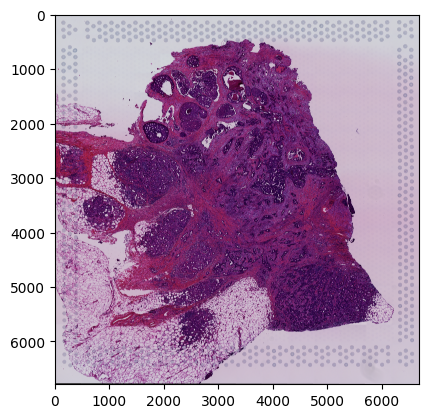

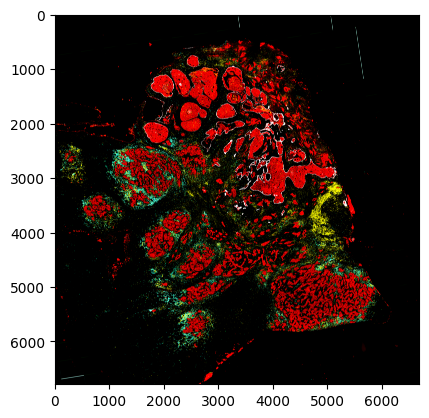

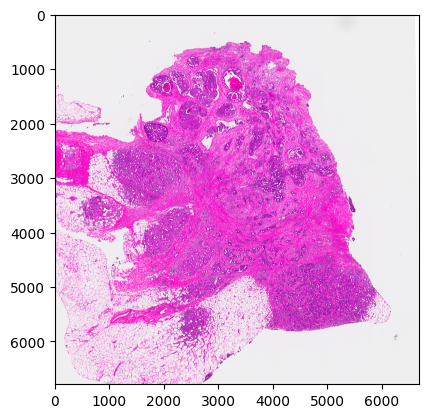

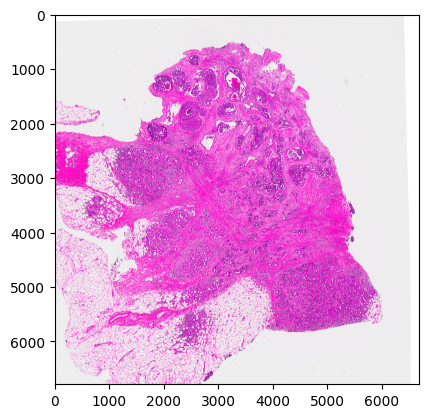

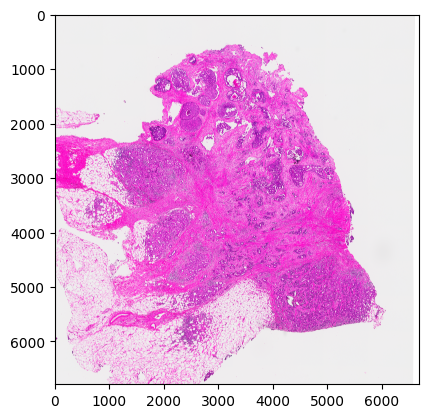

...

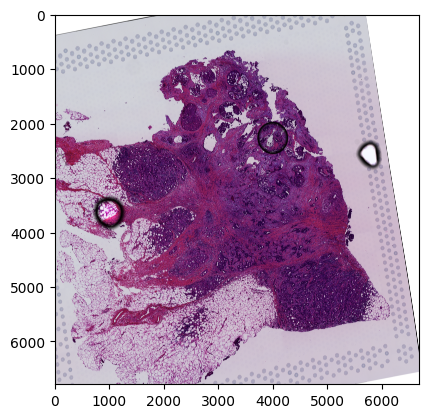

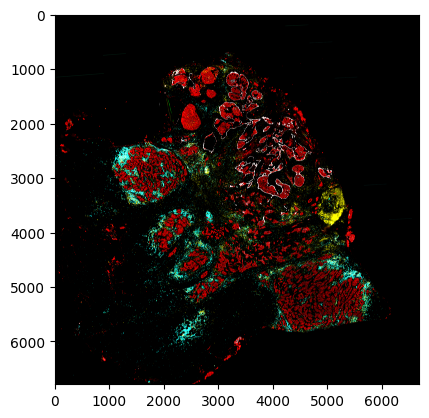

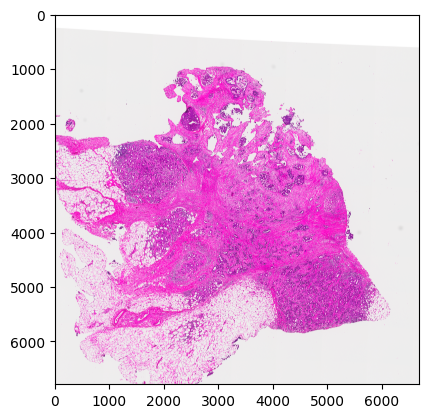

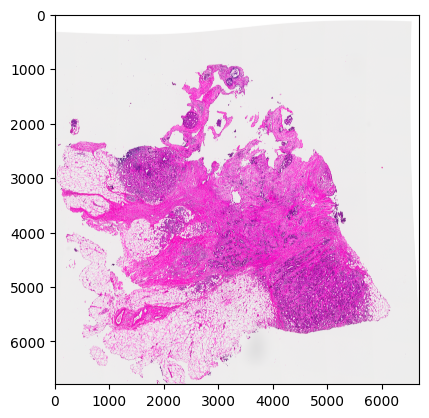

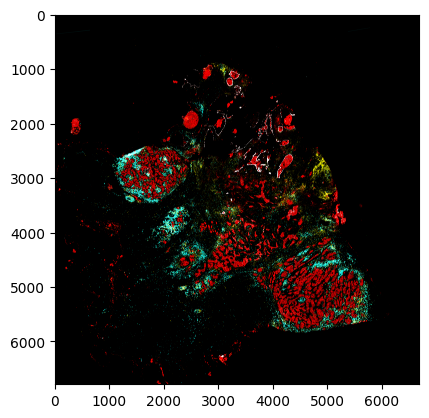

In [20]:
for rgb in rgbs:
    plt.imshow(rgb)
    plt.show()

## combined 

In [36]:
combined_dir = imaris_dir / 'combined'
combined_dir.mkdir(parents=True, exist_ok=True)
root = 'image'
combined_channels = []
combined_channel_idx = 0 # imaris is one indexed

In [37]:
sid_to_z = {entry['sid']: entry['position'] for entry in config['sections']}
# sid_to_idx = {entry['sid']: i for i, entry in enumerate(config['sections'])}

In [38]:
target_size

(6786, 6692)

#### predicted multiplex

In [39]:
# save all channels

predicted_dir = os.path.join(project_dir, 'multiplex_prediction')
predicted_fps = sorted(utils.listfiles(predicted_dir, regex=r'tif$'))
sid_to_predicted_fp = {re.sub(r'^.*s[0-9]+_(.*).ome.tif$', r'\1', fp):fp
                      for fp in predicted_fps}
predicted_channels = multiplex.get_ome_tiff_channels(next(iter(sid_to_predicted_fp.values())))
channel_to_idx = {c:i + combined_channel_idx for i, c in enumerate(predicted_channels)}

for entry in config['sections']:
    sid = entry['sid']
    print(sid)
    z = sid_to_z[sid]
    if sid in sid_to_predicted_fp:
        fp = sid_to_predicted_fp[sid]
        d = multiplex.extract_ome_tiff(fp)
        for channel, img in d.items():
            c_idx = channel_to_idx[channel]
            if img.shape != target_size:
                img = utils.rescale(img, size=target_size, dim_order='h w', target_dtype=img.dtype)
            save_fp = combined_dir / f'{root}_Z{z}_C{c_idx}.tif'
            tifffile.imwrite(save_fp, img, compression='LZW', ome=False, bigtiff=False)

combined_channels += [f'predicted_multiplex_{x}' for x in predicted_channels]
combined_channel_idx += len(predicted_channels)
combined_channel_idx

HT397B1-U1
HT397B1-U2
HT397B1-U4
HT397B1-U8
HT397B1-U11
HT397B1-U12
HT397B1-U16
HT397B1-U21
HT397B1-U22
HT397B1-U20
HT397B1-U28
HT397B1-U31


6

In [40]:
multiplex_dir = imaris_dir / 'multiplex_predicted'
multiplex_dir.mkdir(parents=True, exist_ok=True)
sids, positions = [], []
for entry in config['sections']:
    sid = entry['sid']
    print(sid)
    z = sid_to_z[sid]
    if sid in sid_to_predicted_fp:
        sids.append(sid)
        positions.append(z)
        fp = sid_to_predicted_fp[sid]
        d = multiplex.extract_ome_tiff(fp, channels=predicted_channels)
        for channel, img in d.items():
            c_idx = predicted_channels.index(channel)
            if img.shape != target_size:
                img = utils.rescale(img, size=target_size, dim_order='h w', target_dtype=img.dtype)
            save_fp = multiplex_dir / f'{root}_Z{z}_C{c_idx}.tif'
            tifffile.imwrite(save_fp, img, compression='LZW', ome=False, bigtiff=False)

metadata = {
    'channels': [f'{i+1}_{x}' for i, x in enumerate(predicted_channels)],
    'positions': positions,
    'sids': sids,
}

yaml.safe_dump(metadata, open(multiplex_dir / 'metadata.yaml', 'w'))

HT397B1-U1
HT397B1-U2
HT397B1-U4
HT397B1-U8
HT397B1-U11
HT397B1-U12
HT397B1-U16
HT397B1-U21
HT397B1-U22
HT397B1-U20
HT397B1-U28
HT397B1-U31


#### multiplex

In [41]:
multiplex_fps = [entry['data'][0]['filepath'] for entry in config['sections']
                 if entry['data'][0]['dtype'] == 'multiplex']
all_channels = multiplex.get_common_channels(multiplex_fps)
all_channels

['Bap1 (D)',
 'CD31',
 'CD45 (D)',
 'CD68 (D)',
 'CD8',
 'CK19',
 'COX6c (D)',
 'DAPI',
 'ER',
 'FoxP3',
 'GATA3 (D)',
 'GLUT1-(D)',
 'HLA-DR',
 'Her2 (D)',
 'Keratin 14',
 'Ki67',
 'MGP-(D)',
 'PLAT/tPA (D)',
 'PR-(D)',
 'Pan-Cytokeratin',
 'Podoplanin',
 'SMA-(D)',
 'Vimentin-(D)',
 'cKIT-(D)']

In [42]:

multiplex_channels = [
    'Pan-Cytokeratin',
#   'E-cadherin',
  'Keratin 14',
  'CD45 (D)',
  'CD8',
  'HLA-DR',
  'CD31',
#   'CD68',
  'Podoplanin',
  'SMA-(D)'
]

assert len(set(multiplex_channels).intersection(set(all_channels))) == len(multiplex_channels)

channel_to_idx = {c:i + combined_channel_idx for i, c in enumerate(multiplex_channels)}
for entry in config['sections']:
    sid = entry['sid']
    print(sid)
    z = sid_to_z[sid]
    
    for data in entry['data']:
        if data['dtype'] == 'multiplex':
            d = multiplex.extract_ome_tiff(data['filepath'], channels=multiplex_channels)
            for channel, img in d.items():
                assert img.dtype == np.uint8
                c_idx = channel_to_idx[channel]
                if img.shape != target_size:
                    img = utils.rescale(img, size=target_size, dim_order='h w', target_dtype=img.dtype)
                save_fp = combined_dir / f'{root}_Z{z}_C{c_idx}.tif'
                tifffile.imwrite(save_fp, img, compression='LZW', ome=False, bigtiff=False)

combined_channels += [f'multiplex_{x}' for x in multiplex_channels]
combined_channel_idx += len(multiplex_channels)
combined_channel_idx

HT397B1-U1
HT397B1-U2
HT397B1-U4
HT397B1-U8
HT397B1-U11
HT397B1-U12
HT397B1-U16
HT397B1-U21
HT397B1-U22
HT397B1-U20
HT397B1-U28
HT397B1-U31


14

In [43]:
multiplex_dir = imaris_dir / 'multiplex'
multiplex_dir.mkdir(parents=True, exist_ok=True)
sids, positions = [], []
for entry in config['sections']:
    sid = entry['sid']
    print(sid)
    z = sid_to_z[sid]
    
    for data in entry['data']:
        if data['dtype'] == 'multiplex':
            sids.append(sid)
            positions.append(z)
            d = multiplex.extract_ome_tiff(data['filepath'], channels=all_channels)
            for channel, img in d.items():
                assert img.dtype == np.uint8
                c_idx = all_channels.index(channel)
                if img.shape != target_size:
                    img = utils.rescale(img, size=target_size, dim_order='h w', target_dtype=img.dtype)
                save_fp = multiplex_dir / f'{root}_Z{z}_C{c_idx}.tif'
                tifffile.imwrite(save_fp, img, compression='LZW', ome=False, bigtiff=False)
metadata = {
    'channels': [f'{i+1}_{x}' for i, x in enumerate(all_channels)],
    'positions': positions,
    'sids': sids,
}

yaml.safe_dump(metadata, open(multiplex_dir / 'metadata.yaml', 'w'))

HT397B1-U1
HT397B1-U2
HT397B1-U4
HT397B1-U8
HT397B1-U11
HT397B1-U12
HT397B1-U16
HT397B1-U21
HT397B1-U22
HT397B1-U20
HT397B1-U28
HT397B1-U31


#### xenium

In [30]:
xenium_fps = [entry['data'][0]['filepath'] for entry in config['sections']
                 if entry['data'][0]['dtype'] == 'xenium']
xenium_pool = xenium.get_common_channels(xenium_fps)

xenium_channels = [
    'EPCAM',
    'KRT5',
    'PECAM1',
    'CD4',
    'CD8A',
    'CD3E',
    'CD68',
#     'CD163',
#     'MS4A1',
    'PTPRC',
    'ACTA2',
    'TP53',
    'PDPN'
]

common = set(xenium_channels).intersection(set(xenium_pool))
missing = set(xenium_channels) - common

xenium_pool

[]

In [23]:
tile_size = 10

In [55]:


channel_to_idx = {c:i + combined_channel_idx for i, c in enumerate(xenium_channels)}

for entry in config['sections']:
    sid = entry['sid']
    print(sid)
    z = sid_to_z[sid]
    
    for data in entry['data']:
        if data['dtype'] == 'xenium':
            
            adata = xenium.adata_from_xenium(data['filepath'])
            img = tiling_utils.tile_xenium(adata, tile_size=tile_size)
#             img = tile_xenium(adata, tile_size=tile_size) # return (h, w, c)
            both = set(xenium_channels).intersection(set(adata.var.index.to_list()))
            missing = set(xenium_channels) - both
            data = np.zeros((img.shape[0], img.shape[1], len(xenium_channels)), dtype=img.dtype)
            for channel in both:
                idx = xenium_channels.index(channel)
                data[..., idx] = img[..., adata.var.index.to_list().index(channel)]
            for channel in missing:
                idx = xenium_channels.index(channel)
                data[..., idx] = np.zeros_like(img[..., 0])

    
            data = rearrange(data, 'h w c -> c h w')
            # blur looks better
            data = np.stack([skimage.filters.gaussian(x) for x in data])
            data -= rearrange(data.min((-2, -1)), 'n -> n 1 1')
            data /= rearrange(data.max((-2, -1)), 'n -> n 1 1') + 1e-10
            data *= 255.
            data = data.astype(np.uint8)
            
            for channel, img in zip(xenium_channels, data):
                c_idx = channel_to_idx[channel]
                if img.shape != target_size:
                    img = utils.rescale(img, size=target_size, dim_order='h w', target_dtype=img.dtype)
                save_fp = combined_dir / f'{root}_Z{z}_C{c_idx}.tif'
                tifffile.imwrite(save_fp, img, compression='LZW', ome=False, bigtiff=False)
                
combined_channels += [f'xenium_{x}' for x in xenium_channels]
combined_channel_idx += len(xenium_channels)
combined_channel_idx

HT206B1-U1
HT206B1-U2
HT206B1-U4
HT206B1-U5
HT206B1-U8
HT206B1-U9
HT206B1-U10
HT206B1-U12
HT206B1-U13
HT206B1-U16
HT206B1-U17
HT206B1-U18
HT206B1-U20
HT206B1-U21
HT206B1-U24


25

In [24]:
xenium_dir = imaris_dir / 'xenium'
xenium_dir.mkdir(parents=True, exist_ok=True)
sids, positions = [], []
for entry in config['sections']:
    sid = entry['sid']
    print(sid)
    z = sid_to_z[sid]
    
    for data in entry['data']:
        if data['dtype'] == 'xenium':
            sids.append(sid)
            positions.append(z)
            adata = xenium.adata_from_xenium(data['filepath'])
            img = tiling_utils.tile_xenium(adata, tile_size=tile_size)
#             both = set(xenium_pool).intersection(set(adata.var.index.to_list()))
#             missing = set(xenium_pool) - both
#             data = np.zeros((img.shape[0], img.shape[1], len(xenium_pool)), dtype=img.dtype)
    
#             for channel in both:
#                 idx = xenium_pool.index(channel)
#                 data[..., idx] = img[..., adata.var.index.to_list().index(channel)]
#             for channel in missing:
#                 idx = xenium_pool.index(channel)
#                 data[..., idx] = np.zeros_like(img[..., 0])

            idxs = [xenium_pool.index(c) for c in adata.var.index.to_list() if c in xenium_pool]
            data = img[..., idxs]
    
            data = rearrange(data, 'h w c -> c h w')
            # blur looks better
            data = np.stack([skimage.filters.gaussian(x) for x in data])
            data -= rearrange(data.min((-2, -1)), 'n -> n 1 1')
            data /= rearrange(data.max((-2, -1)), 'n -> n 1 1') + 1e-10
            data *= 255.
            data = data.astype(np.uint8)
            
            for channel, img in zip(xenium_pool, data):
#                 c_idx = channel_to_idx[channel]
                c_idx = xenium_pool.index(channel)
                if img.shape != target_size:
                    img = utils.rescale(img, size=target_size, dim_order='h w', target_dtype=img.dtype)
                save_fp = xenium_dir / f'{root}_Z{z}_C{c_idx}.tif'
                tifffile.imwrite(save_fp, img, compression='LZW', ome=False, bigtiff=False)
metadata = {
    'channels': [f'{i+1}_{x}' for i, x in enumerate(xenium_pool)],
    'positions': positions,
    'sids': sids,
}

yaml.safe_dump(metadata, open(xenium_dir / 'metadata.yaml', 'w'))

HT913Z1-U1
HT913Z1-U2
HT913Z1-U3
HT913Z1-U5
HT913Z1-U7
HT913Z1-U9
HT913Z1-U10
HT913Z1-U11
HT913Z1-U12
HT913Z1-U13
HT913Z1-U15
HT913Z1-U17
HT913Z1-U19
HT913Z1-U21
HT913Z1-U22
HT913Z1-U24
HT913Z1-U26
HT913Z1-U28
HT913Z1-U30
HT913Z1-U33
HT913Z1-U34
HT913Z1-U35
HT913Z1-U36
HT913Z1-U38
HT913Z1-U40
HT913Z1-U41
HT913Z1-U42
HT913Z1-U44
HT913Z1-U46
HT913Z1-U48
HT913Z1-U50
HT913Z1-U51
HT913Z1-U52
HT913Z1-U53
HT913Z1-U54
HT913Z1-U55
HT913Z1-U57
HT913Z1-U61
HT913Z1-U62
HT913Z1-U63
HT913Z1-U65
HT913Z1-U67
HT913Z1-U69
HT913Z1-U71
HT913Z1-U72
HT913Z1-U74
HT913Z1-U76
HT913Z1-U78
HT913Z1-U80
HT913Z1-U81
HT913Z1-U82
HT913Z1-U83
HT913Z1-U85
HT913Z1-U87
HT913Z1-U89
HT913Z1-U91
HT913Z1-U92
HT913Z1-U94
HT913Z1-U96
HT913Z1-U99
HT913Z1-U101
HT913Z1-U102
HT913Z1-U103
HT913Z1-U106
HT913Z1-U108
HT913Z1-U110
HT913Z1-U111
HT913Z1-U112
HT913Z1-U115
HT913Z1-U117
HT913Z1-U119
HT913Z1-U120
HT913Z1-U121
HT913Z1-U122
HT913Z1-U124
HT913Z1-U125


#### cosmx

In [41]:
cosmx_fps = [entry['data'][0]['filepath'] for entry in config['sections']
                 if entry['data'][0]['dtype'] == 'cosmx']
cosmx_pool = cosmx.get_common_channels(cosmx_fps)
cosmx_pool

[]

In [31]:
cosmx_channels = [
    'EPCAM',
    'KRT5',
#     'PECAM1',
#     'CD4',
#     'CD8A',
#     'CD3E',
    'CD68',
#     'CD163',
#     'MS4A1',
#     'PTPRC',
#     'ACTA2',
]
common = set(cosmx_channels).intersection(set(cosmx_pool))
missing = set(cosmx_channels) - common
assert len(missing) == 0

In [32]:
channel_to_idx = {c:i + combined_channel_idx for i, c in enumerate(cosmx_channels)}
channel_to_idx

{'EPCAM': 22, 'KRT5': 23, 'CD68': 24}

In [33]:
tile_size = 10

In [35]:
for entry in config['sections']:
    sid = entry['sid']
    print(sid)
    z = sid_to_z[sid]
    
    for data in entry['data']:
        if data['dtype'] == 'cosmx':
            
            adata = cosmx.adata_from_cosmx(data['filepath'])
            adata = adata[:, cosmx_channels]

            data = tiling_utils.tile_xenium(adata, tile_size=tile_size) # return (h, w, c)
            data = rearrange(data, 'h w c -> c h w')
            # blur looks better
            data = np.stack([skimage.filters.gaussian(x) for x in data])
            data -= rearrange(data.min((-2, -1)), 'n -> n 1 1')
            data /= rearrange(data.max((-2, -1)), 'n -> n 1 1')
            data *= 255.
            data = data.astype(np.uint8)

            for channel, img in zip(cosmx_channels, data):
                c_idx = channel_to_idx[channel]
                if img.shape != target_size:
                    img = utils.rescale(img, size=target_size, dim_order='h w', target_dtype=img.dtype)
                save_fp = combined_dir / f'{root}_Z{z}_C{c_idx}.tif'
                tifffile.imwrite(save_fp, img, compression='LZW', ome=False, bigtiff=False)

HT704B1-U1
HT704B1-U11
HT704B1-U12
HT704B1-U14


/data/estorrs/mushroom/mushroom/visualization/tiling_utils.py:18: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['grid_name'] = [f'{x // tile_size}_{y // tile_size}' for x, y in adata.obsm['spatial'].astype(int)]


HT704B1-U15
HT704B1-U17
HT704B1-U19
HT704B1-U20
HT704B1-U22


/data/estorrs/mushroom/mushroom/visualization/tiling_utils.py:18: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['grid_name'] = [f'{x // tile_size}_{y // tile_size}' for x, y in adata.obsm['spatial'].astype(int)]


HT704B1-U23
HT704B1-U26
HT704B1-U27
HT704B1-U28
HT704B1-U31
HT704B1-U33
HT704B1-U35
HT704B1-U36
HT704B1-U39
HT704B1-U41
HT704B1-U43
HT704B1-U44
HT704B1-U47


/data/estorrs/mushroom/mushroom/visualization/tiling_utils.py:18: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['grid_name'] = [f'{x // tile_size}_{y // tile_size}' for x, y in adata.obsm['spatial'].astype(int)]


HT704B1-U48
HT704B1-U50
HT704B1-U53
HT704B1-U54
HT704B1-U56


/data/estorrs/mushroom/mushroom/visualization/tiling_utils.py:18: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['grid_name'] = [f'{x // tile_size}_{y // tile_size}' for x, y in adata.obsm['spatial'].astype(int)]


HT704B1-U57
HT704B1-U60
HT704B1-U61
HT704B1-U65
HT704B1-U68
HT704B1-U69
HT704B1-U73
HT704B1-U76
HT704B1-U81
HT704B1-U82
HT704B1-U84
HT704B1-U85
HT704B1-U90
HT704B1-U91
HT704B1-U93


In [36]:
combined_channels += [f'cosmx_{x}' for x in cosmx_channels]
combined_channel_idx += len(cosmx_channels)
combined_channel_idx

25

#### merged channels

In [44]:
combined_channels

['predicted_multiplex_Pan-Cytokeratin',
 'predicted_multiplex_Keratin 14',
 'predicted_multiplex_CD31',
 'predicted_multiplex_CD45 (D)',
 'predicted_multiplex_HLA-DR',
 'predicted_multiplex_CD8',
 'multiplex_Pan-Cytokeratin',
 'multiplex_Keratin 14',
 'multiplex_CD45 (D)',
 'multiplex_CD8',
 'multiplex_HLA-DR',
 'multiplex_CD31',
 'multiplex_Podoplanin',
 'multiplex_SMA-(D)']

In [45]:
to_merge = [
    'predicted_multiplex_Pan-Cytokeratin',
    'multiplex_Pan-Cytokeratin',
#     'xenium_EPCAM',
#     'cosmx_EPCAM'
]
idxs = [combined_channels.index(c) for c in to_merge]
idxs

[0, 6]

In [46]:
fps

['/data/estorrs/mushroom/data/projects/submission_v1/HT397B1/imaris/combined/HT397B1_C0.tif',
 '/data/estorrs/mushroom/data/projects/submission_v1/HT397B1/imaris/combined/HT397B1_C1.tif',
 '/data/estorrs/mushroom/data/projects/submission_v1/HT397B1/imaris/combined/HT397B1_C10.tif',
 '/data/estorrs/mushroom/data/projects/submission_v1/HT397B1/imaris/combined/HT397B1_C11.tif',
 '/data/estorrs/mushroom/data/projects/submission_v1/HT397B1/imaris/combined/HT397B1_C12.tif',
 '/data/estorrs/mushroom/data/projects/submission_v1/HT397B1/imaris/combined/HT397B1_C13.tif',
 '/data/estorrs/mushroom/data/projects/submission_v1/HT397B1/imaris/combined/HT397B1_C14.tif',
 '/data/estorrs/mushroom/data/projects/submission_v1/HT397B1/imaris/combined/HT397B1_C15.tif',
 '/data/estorrs/mushroom/data/projects/submission_v1/HT397B1/imaris/combined/HT397B1_C16.tif',
 '/data/estorrs/mushroom/data/projects/submission_v1/HT397B1/imaris/combined/HT397B1_C17.tif',
 '/data/estorrs/mushroom/data/projects/submission_v1

In [47]:
import shutil
fps = sorted(utils.listfiles(combined_dir, regex=r'tif$'))
names = [fp.split('/')[-1] for fp in fps]
for name in names:
    c_idx = int(re.sub(r'^.*C([0-9]+).tif$', r'\1', name))
    z = int(re.sub(r'^.*Z([0-9]+)_C.*.tif$', r'\1', name))
    new_name = f'{root}_Z{z}_C{combined_channel_idx + 1}.tif'
    if c_idx in idxs:
        shutil.copy(combined_dir / name, combined_dir / new_name)

In [48]:
combined_channel_idx += 1
combined_channels.append('custom_tumor')

In [50]:
to_merge = [
#     'predicted_multiplex_SMA-(D)',
    'multiplex_SMA-(D)',
#     'xenium_ACTA2',
#     'predicted_multiplex_Podoplanin (D)',
#     'multiplex_Podoplanin (D)',
#     'xenium_PDPN',
#     'cosmx_KRT5'
]
idxs = [combined_channels.index(c) for c in to_merge]
for name in names:
    c_idx = int(re.sub(r'^.*C([0-9]+).tif$', r'\1', name))
    z = int(re.sub(r'^.*Z([0-9]+)_C.*.tif$', r'\1', name))
    new_name = f'{root}_Z{z}_C{combined_channel_idx + 1}.tif'
    if c_idx in idxs:
        shutil.copy(combined_dir / name, combined_dir / new_name)

In [51]:
combined_channel_idx += 1
combined_channels.append('custom_myoepi')

In [65]:
to_merge = [
    'predicted_multiplex_Pan-Cytokeratin',
    'multiplex_Pan-Cytokeratin',
]
idxs = [combined_channels.index(c) for c in to_merge]
for name in names:
    c_idx = int(re.sub(r'^.*C([0-9]+).tif$', r'\1', name))
    z = int(re.sub(r'^.*Z([0-9]+)_C.*.tif$', r'\1', name))
    new_name = f'{root}_Z{z}_C{combined_channel_idx + 1}.tif'
    if c_idx in idxs:
        shutil.copy(combined_dir / name, combined_dir / new_name)
        
combined_channel_idx += 1
combined_channels.append('custom_tumor_filtered')

In [66]:
to_merge = [
    'predicted_multiplex_SMA (D)',
    'multiplex_SMA (D)',
#     'predicted_multiplex_Podoplanin (D)',
    'multiplex_Podoplanin (D)',
]
idxs = [combined_channels.index(c) for c in to_merge]
for name in names:
    c_idx = int(re.sub(r'^.*C([0-9]+).tif$', r'\1', name))
    z = int(re.sub(r'^.*Z([0-9]+)_C.*.tif$', r'\1', name))
    new_name = f'{root}_Z{z}_C{combined_channel_idx + 1}.tif'
    if c_idx in idxs:
        shutil.copy(combined_dir / name, combined_dir / new_name)
        
combined_channel_idx += 1
combined_channels.append('custom_myoepi_filtered')

In [52]:
metadata = {
    'channels': [f'{i+1}_{x}' for i, x in enumerate(combined_channels)],
    'positions': [entry['position'] for entry in config['sections']],
    'sids': [entry['sid'] for entry in config['sections']],
}

In [53]:
yaml.safe_dump(metadata, open(combined_dir / 'metadata.yaml', 'w'))

In [54]:
combined_dir

PosixPath('/data/estorrs/mushroom/data/projects/submission_v1/HT397B1/imaris/combined')

In [55]:
fps = sorted(utils.listfiles(combined_dir))
fps

['/data/estorrs/mushroom/data/projects/submission_v1/HT397B1/imaris/combined/image_Z105_C10.tif',
 '/data/estorrs/mushroom/data/projects/submission_v1/HT397B1/imaris/combined/image_Z105_C11.tif',
 '/data/estorrs/mushroom/data/projects/submission_v1/HT397B1/imaris/combined/image_Z105_C12.tif',
 '/data/estorrs/mushroom/data/projects/submission_v1/HT397B1/imaris/combined/image_Z105_C13.tif',
 '/data/estorrs/mushroom/data/projects/submission_v1/HT397B1/imaris/combined/image_Z105_C15.tif',
 '/data/estorrs/mushroom/data/projects/submission_v1/HT397B1/imaris/combined/image_Z105_C16.tif',
 '/data/estorrs/mushroom/data/projects/submission_v1/HT397B1/imaris/combined/image_Z105_C6.tif',
 '/data/estorrs/mushroom/data/projects/submission_v1/HT397B1/imaris/combined/image_Z105_C7.tif',
 '/data/estorrs/mushroom/data/projects/submission_v1/HT397B1/imaris/combined/image_Z105_C8.tif',
 '/data/estorrs/mushroom/data/projects/submission_v1/HT397B1/imaris/combined/image_Z105_C9.tif',
 '/data/estorrs/mushroom

In [86]:
tf = tifffile.TiffFile(fps[3])
p = tf.pages[0]
p.shape, p.dtype

((6530, 7258), dtype('uint8'))

In [88]:
for fp in fps:
    if '.tif' in fp:
        tf = tifffile.TiffFile(fp)
        p = tf.pages[0]
        print(fp)
        print(p.shape, p.dtype)

/data/estorrs/mushroom/data/projects/submission_v1/HT891Z1/imaris/combined/image_Z0_C16.tif
(6530, 7258) uint8
/data/estorrs/mushroom/data/projects/submission_v1/HT891Z1/imaris/combined/image_Z0_C17.tif
(6530, 7258) uint8
/data/estorrs/mushroom/data/projects/submission_v1/HT891Z1/imaris/combined/image_Z0_C18.tif
(6530, 7258) uint8
/data/estorrs/mushroom/data/projects/submission_v1/HT891Z1/imaris/combined/image_Z0_C19.tif
(6530, 7258) uint8
/data/estorrs/mushroom/data/projects/submission_v1/HT891Z1/imaris/combined/image_Z0_C20.tif
(6530, 7258) uint8
/data/estorrs/mushroom/data/projects/submission_v1/HT891Z1/imaris/combined/image_Z0_C21.tif
(6530, 7258) uint8
/data/estorrs/mushroom/data/projects/submission_v1/HT891Z1/imaris/combined/image_Z0_C22.tif
(6530, 7258) uint8
/data/estorrs/mushroom/data/projects/submission_v1/HT891Z1/imaris/combined/image_Z0_C24.tif
(6530, 7258) uint8
/data/estorrs/mushroom/data/projects/submission_v1/HT891Z1/imaris/combined/image_Z0_C25.tif
(6530, 7258) uint8
/

/data/estorrs/mushroom/data/projects/submission_v1/HT891Z1/imaris/combined/image_Z570_C25.tif
(6530, 7258) uint8
/data/estorrs/mushroom/data/projects/submission_v1/HT891Z1/imaris/combined/image_Z570_C26.tif
(6530, 7258) uint8
/data/estorrs/mushroom/data/projects/submission_v1/HT891Z1/imaris/combined/image_Z570_C27.tif
(6530, 7258) uint8
/data/estorrs/mushroom/data/projects/submission_v1/HT891Z1/imaris/combined/image_Z570_C3.tif
(6530, 7258) uint8
/data/estorrs/mushroom/data/projects/submission_v1/HT891Z1/imaris/combined/image_Z570_C4.tif
(6530, 7258) uint8
/data/estorrs/mushroom/data/projects/submission_v1/HT891Z1/imaris/combined/image_Z570_C5.tif
(6530, 7258) uint8
/data/estorrs/mushroom/data/projects/submission_v1/HT891Z1/imaris/combined/image_Z570_C6.tif
(6530, 7258) uint8
/data/estorrs/mushroom/data/projects/submission_v1/HT891Z1/imaris/combined/image_Z570_C7.tif
(6530, 7258) uint8
/data/estorrs/mushroom/data/projects/submission_v1/HT891Z1/imaris/combined/image_Z575_C0.tif
(6530, 7

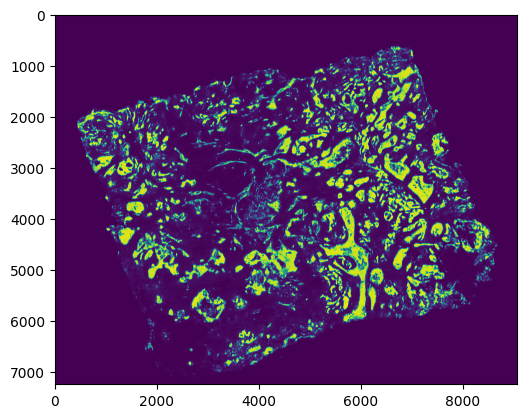

In [60]:
x = tifffile.imread(
    '/data/estorrs/mushroom/data/projects/submission_v1/HT704B1/imaris/combined/image_Z110_C18.tif'
)
plt.imshow(x)

In [56]:
positions = sorted(sid_to_z.values())
z_to_idx = {v:positions.index(v) for v in sid_to_z.values()}

In [57]:
# fill in blanks
fps = sorted(utils.listfiles(combined_dir, regex=r'tif$'))
names = [fp.split('/')[-1] for fp in fps]
names

['image_Z105_C10.tif',
 'image_Z105_C11.tif',
 'image_Z105_C12.tif',
 'image_Z105_C13.tif',
 'image_Z105_C15.tif',
 'image_Z105_C16.tif',
 'image_Z105_C6.tif',
 'image_Z105_C7.tif',
 'image_Z105_C8.tif',
 'image_Z105_C9.tif',
 'image_Z125_C0.tif',
 'image_Z125_C1.tif',
 'image_Z125_C15.tif',
 'image_Z125_C2.tif',
 'image_Z125_C3.tif',
 'image_Z125_C4.tif',
 'image_Z125_C5.tif',
 'image_Z145_C0.tif',
 'image_Z145_C1.tif',
 'image_Z145_C15.tif',
 'image_Z145_C2.tif',
 'image_Z145_C3.tif',
 'image_Z145_C4.tif',
 'image_Z145_C5.tif',
 'image_Z150_C10.tif',
 'image_Z150_C11.tif',
 'image_Z150_C12.tif',
 'image_Z150_C13.tif',
 'image_Z150_C15.tif',
 'image_Z150_C16.tif',
 'image_Z150_C6.tif',
 'image_Z150_C7.tif',
 'image_Z150_C8.tif',
 'image_Z150_C9.tif',
 'image_Z15_C0.tif',
 'image_Z15_C1.tif',
 'image_Z15_C15.tif',
 'image_Z15_C2.tif',
 'image_Z15_C3.tif',
 'image_Z15_C4.tif',
 'image_Z15_C5.tif',
 'image_Z35_C0.tif',
 'image_Z35_C1.tif',
 'image_Z35_C15.tif',
 'image_Z35_C2.tif',
 'ima

In [58]:
blank = np.zeros(target_size, dtype=np.uint8)
for z in [entry['position'] for entry in config['sections']]:
# for z in range(len(config['sections'])):
    for c in range(combined_channel_idx + 1):
        name = f'{root}_Z{z}_C{c}.tif'
        if name not in names:
#             print(name)
            tifffile.imwrite(combined_dir / name, blank, compression='LZW', ome=False, bigtiff=False)

In [59]:
combined_dir

PosixPath('/data/estorrs/mushroom/data/projects/submission_v1/HT397B1/imaris/combined')

(7250, 9063)


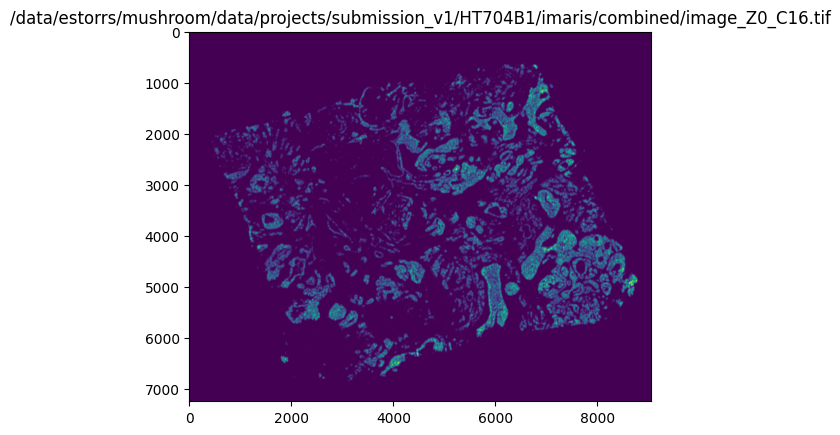

(7250, 9063)


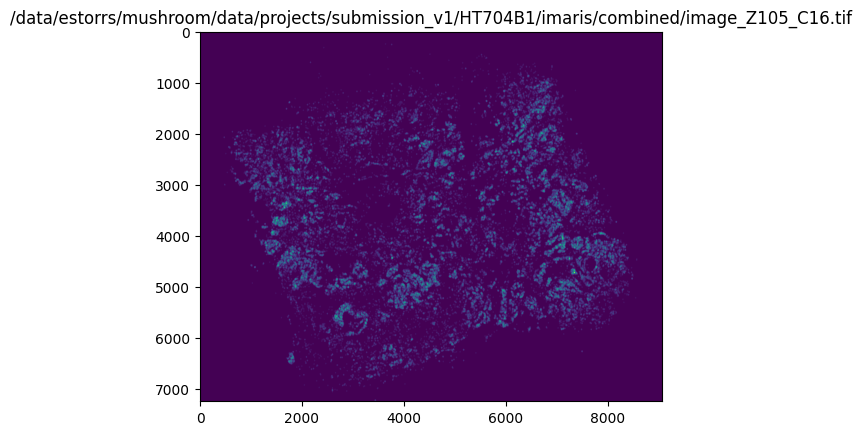

(7250, 9063)


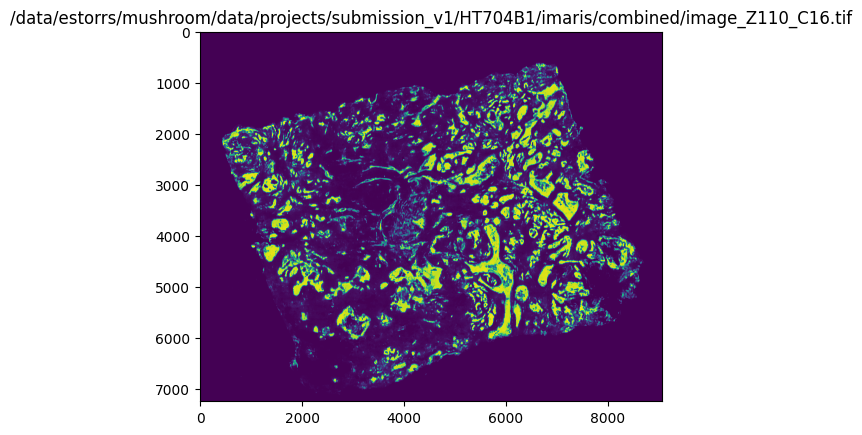

(7250, 9063)


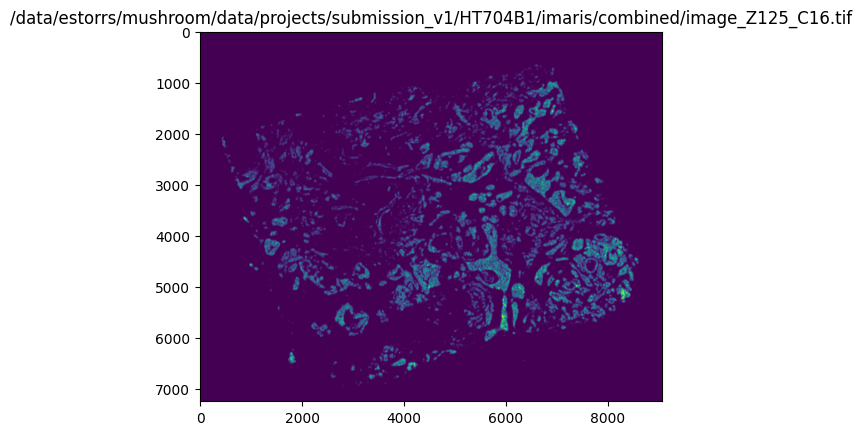

(7250, 9063)


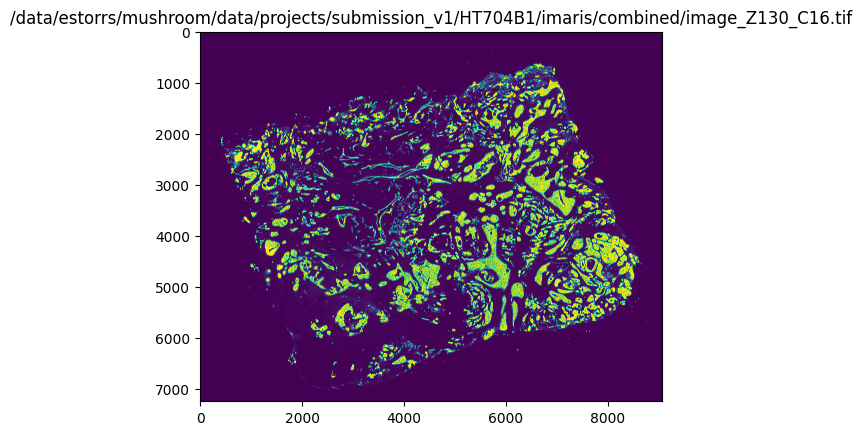

(7250, 9063)


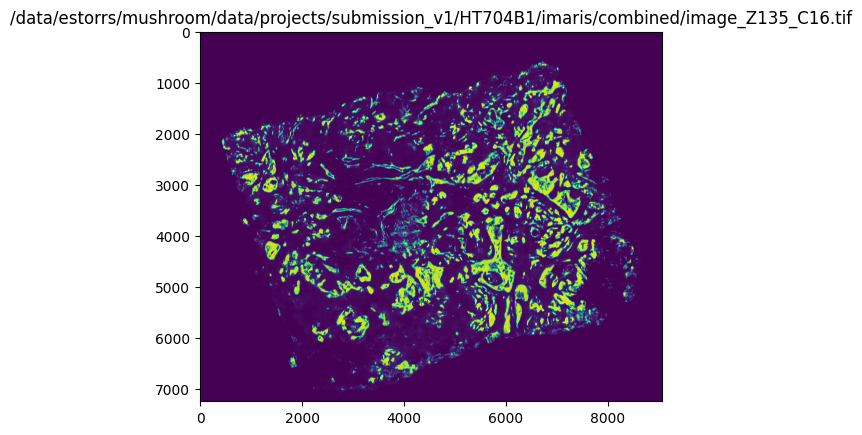

(7250, 9063)


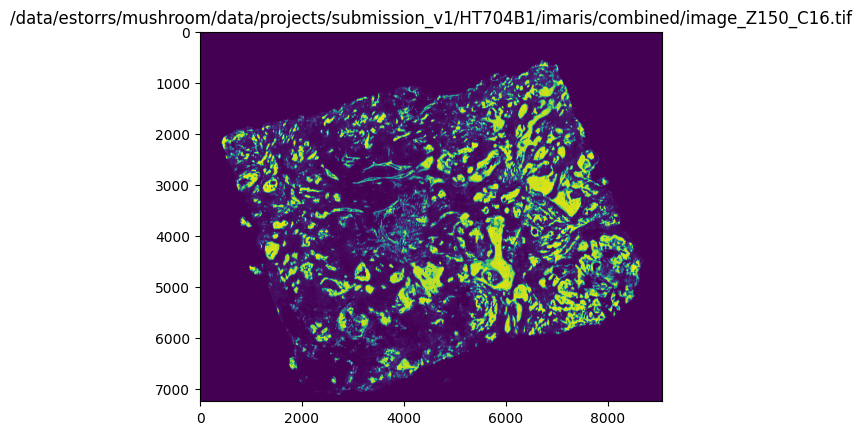

(7250, 9063)


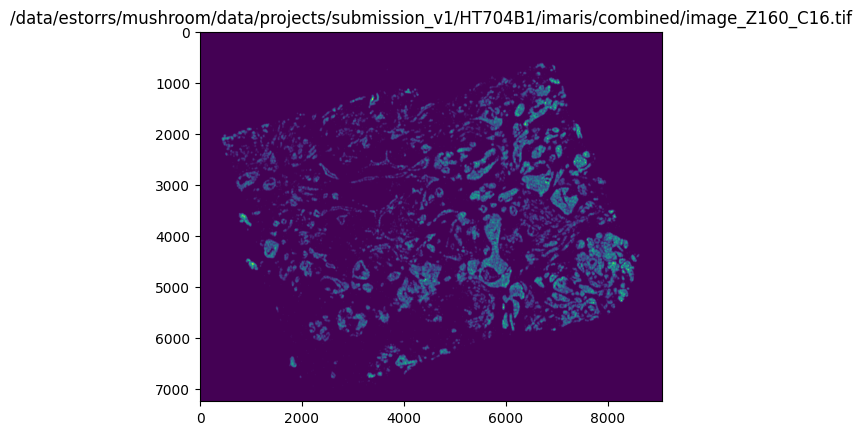

(7250, 9063)


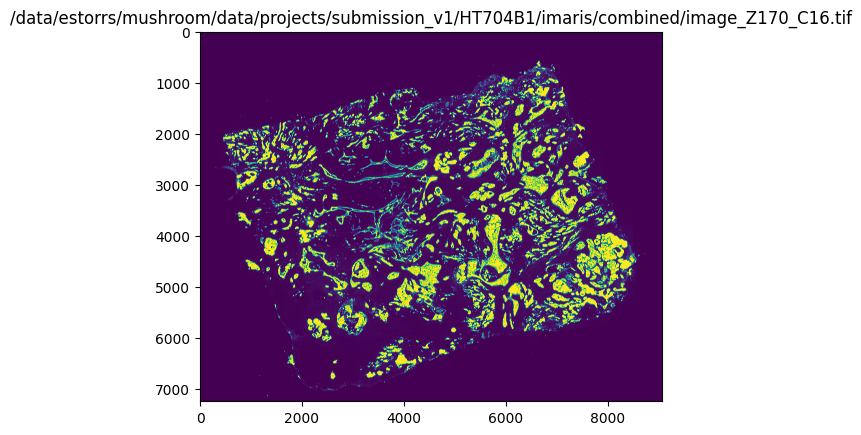

(7250, 9063)


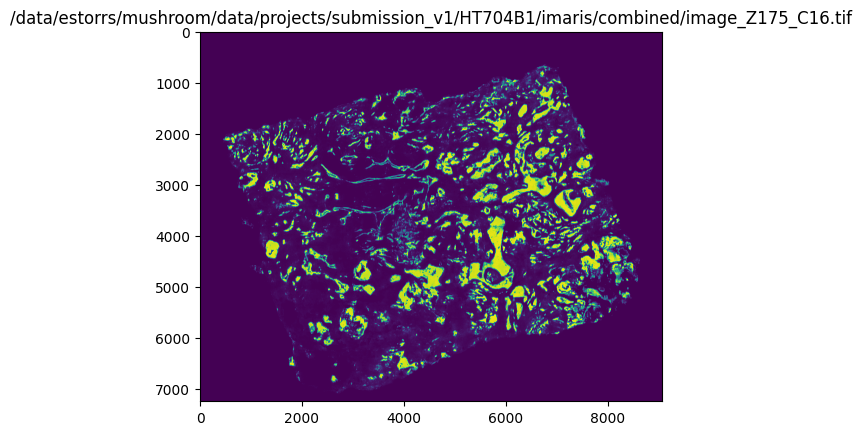

(7250, 9063)


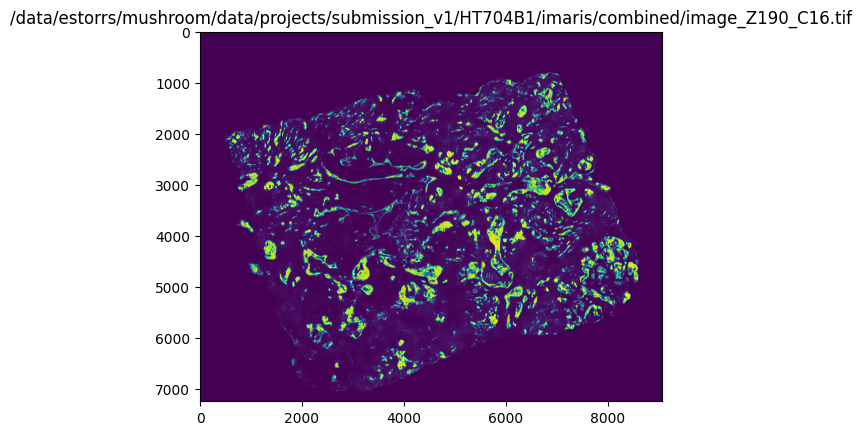

(7250, 9063)


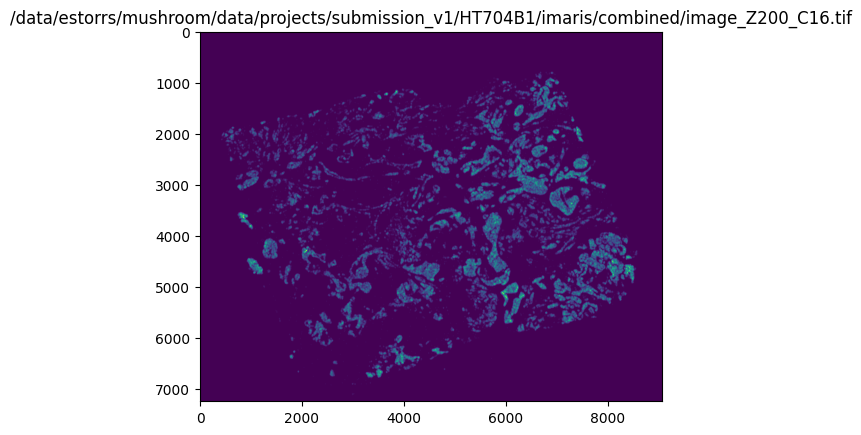

(7250, 9063)


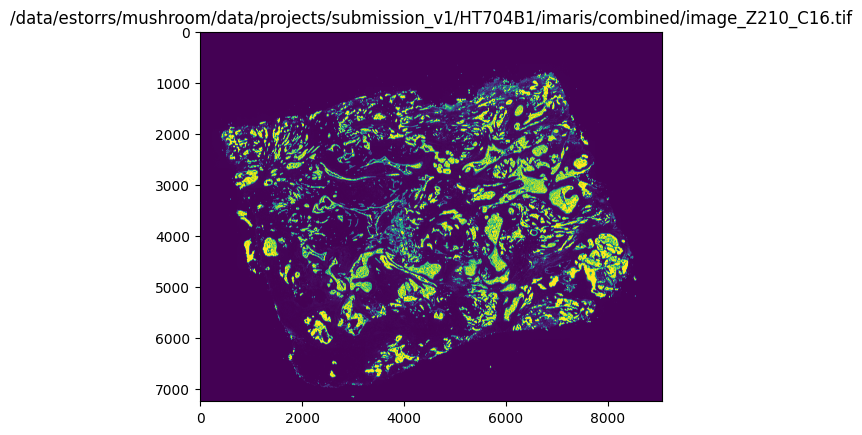

(7250, 9063)


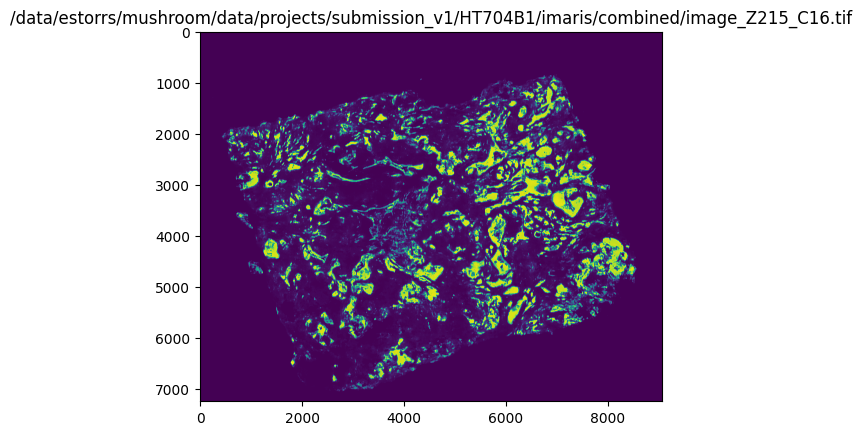

(7250, 9063)


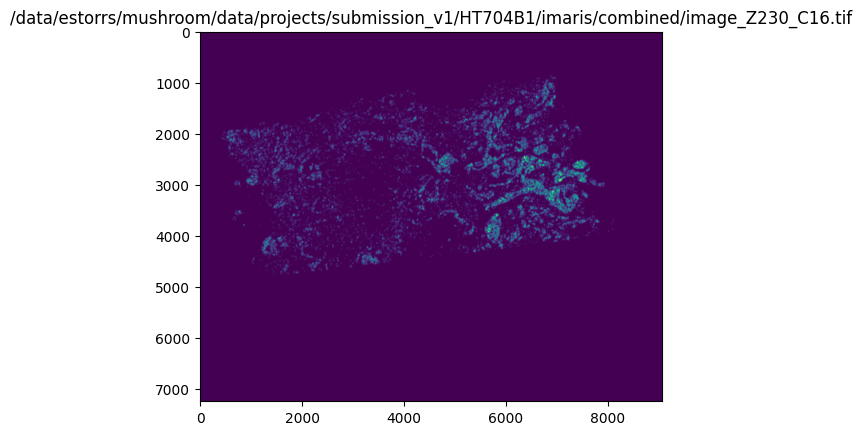

(7250, 9063)


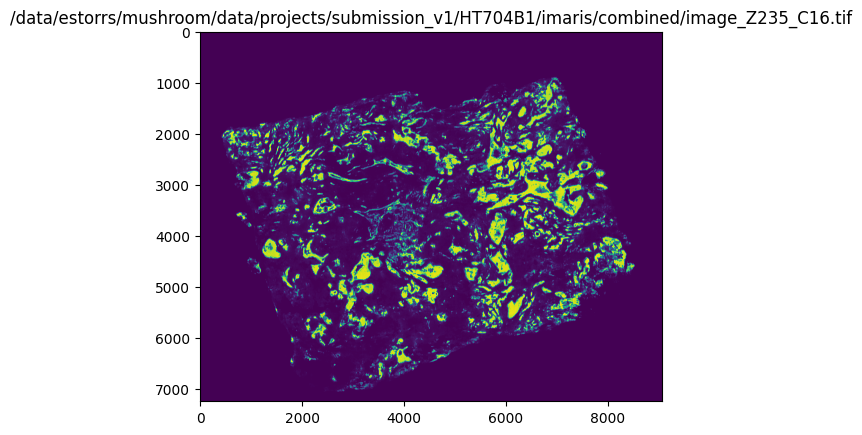

(7250, 9063)


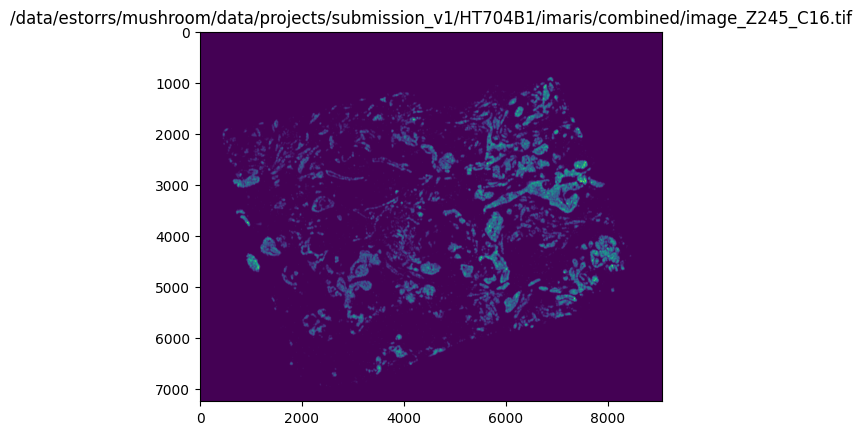

(7250, 9063)


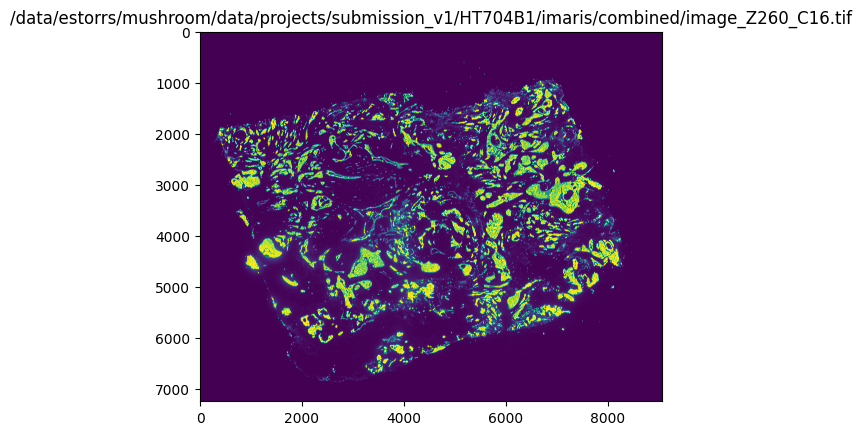

(7250, 9063)


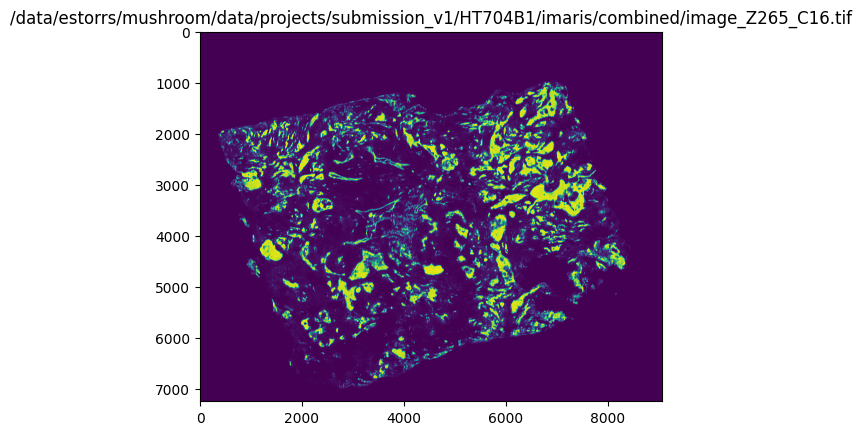

(7250, 9063)


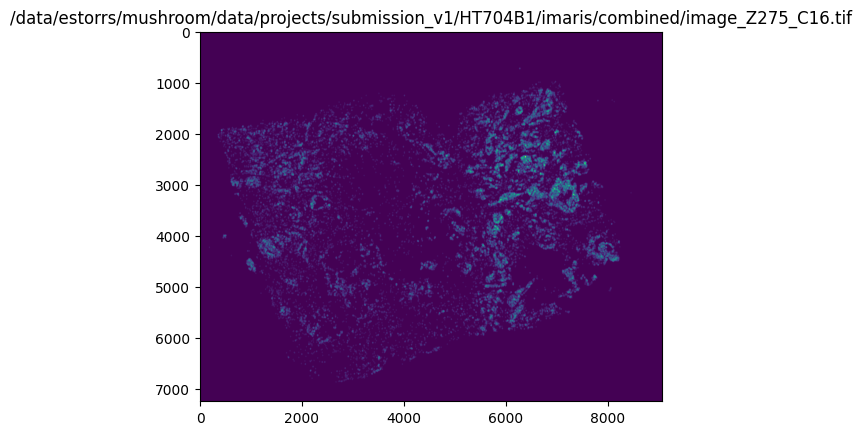

(7250, 9063)


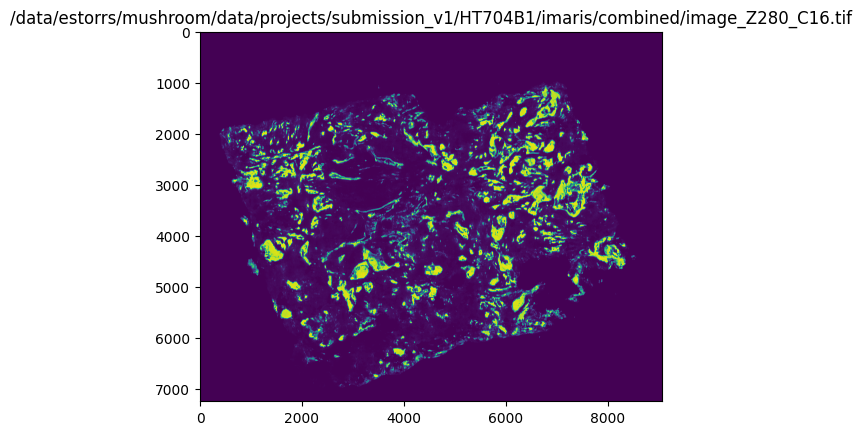

(7250, 9063)


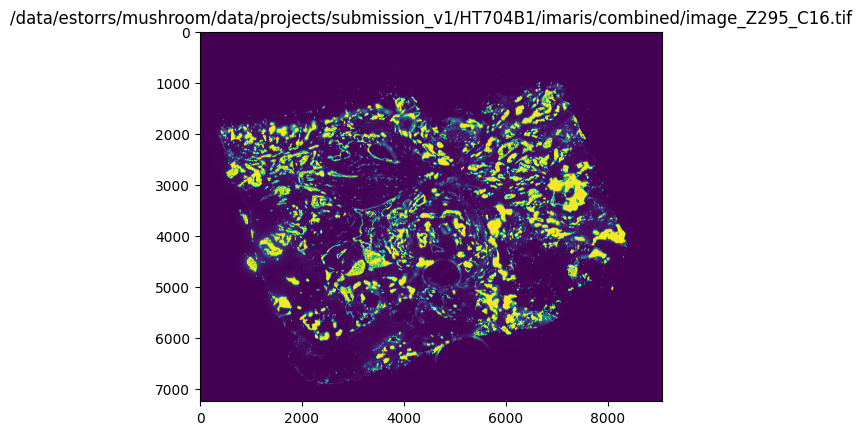

(7250, 9063)


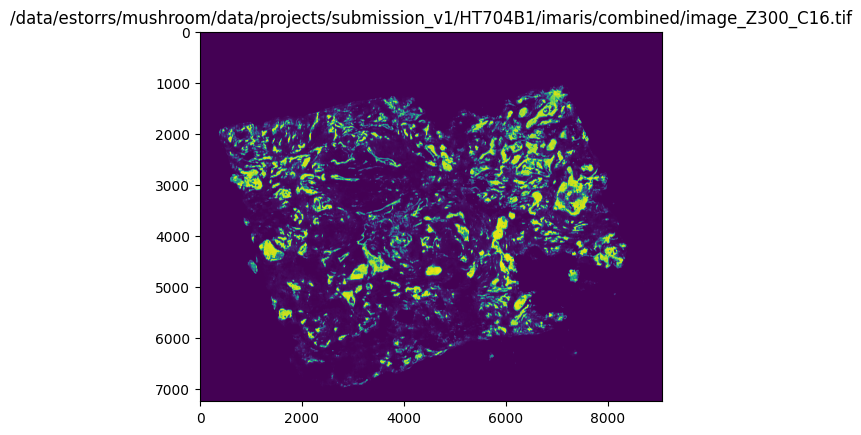

(7250, 9063)


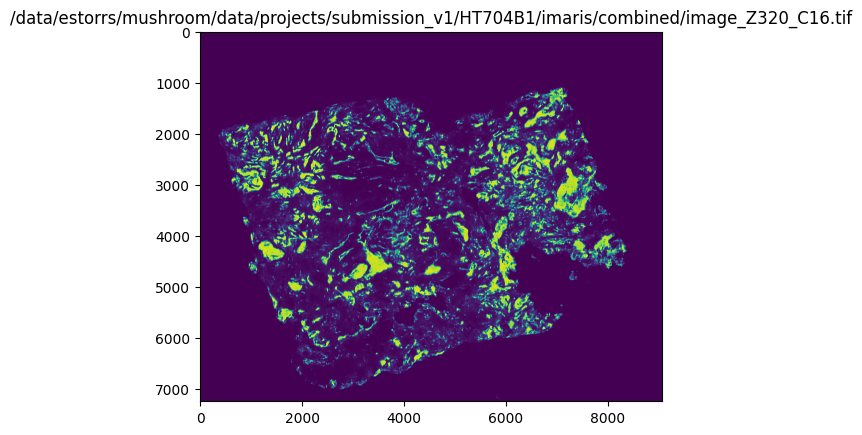

(7250, 9063)


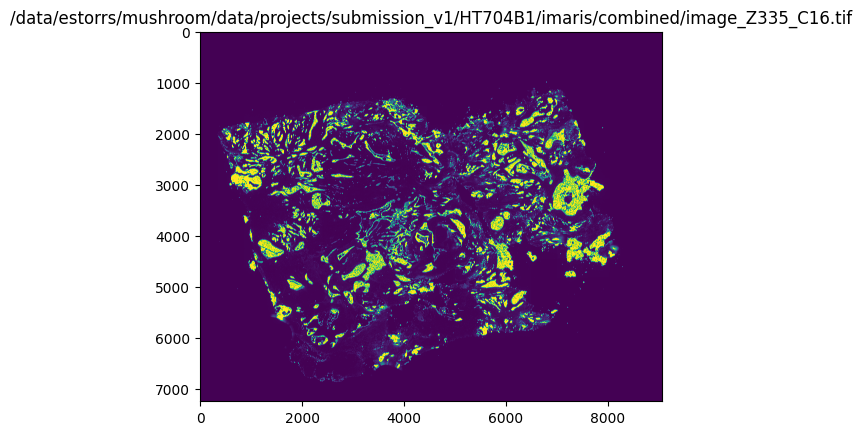

(7250, 9063)


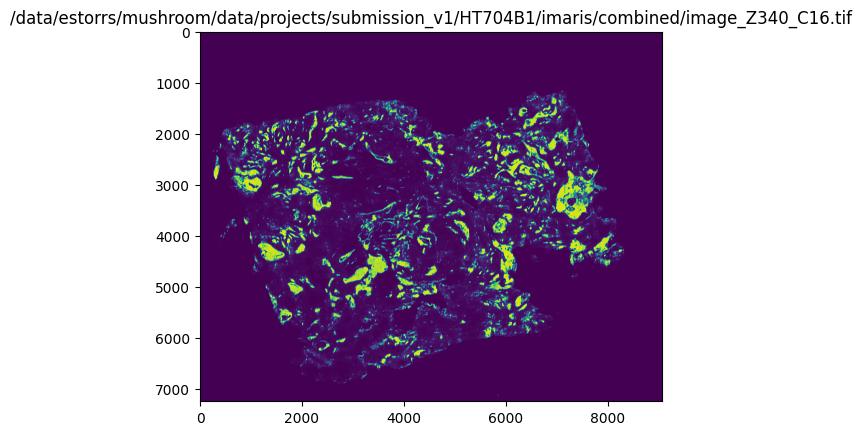

(7250, 9063)


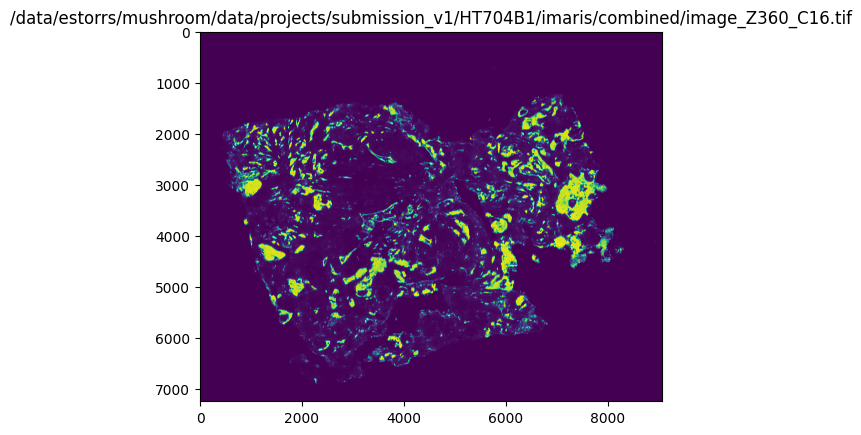

(7250, 9063)


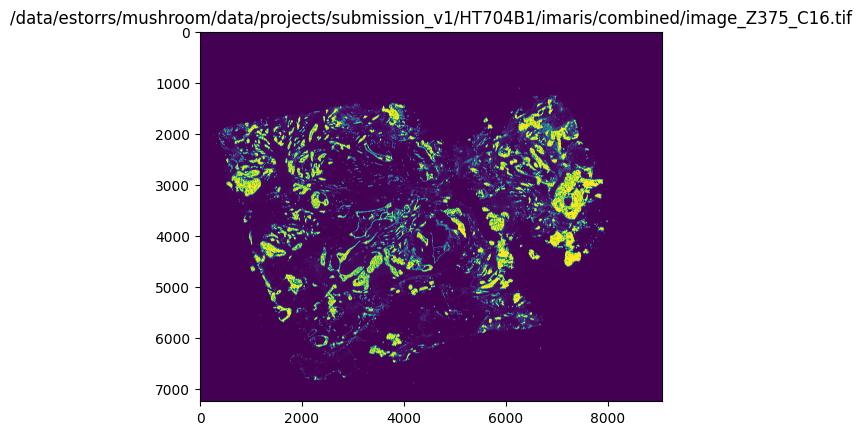

(7250, 9063)


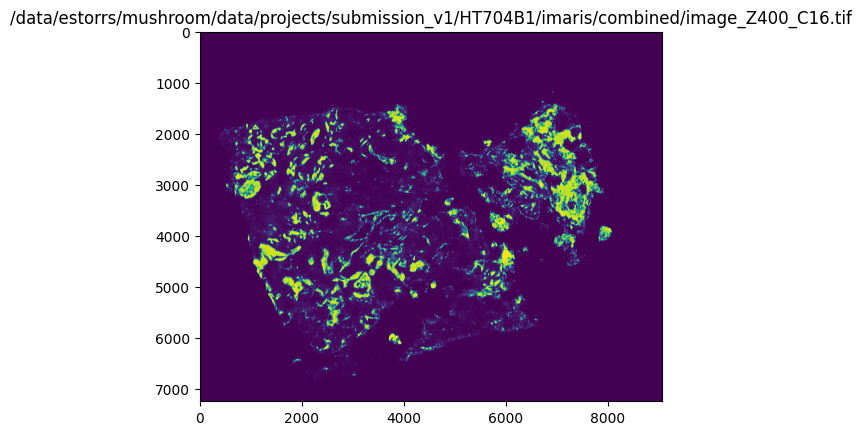

(7250, 9063)


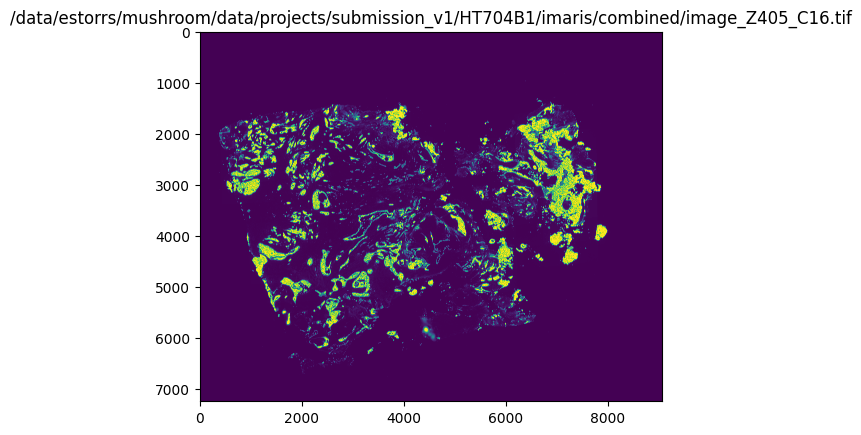

(7250, 9063)


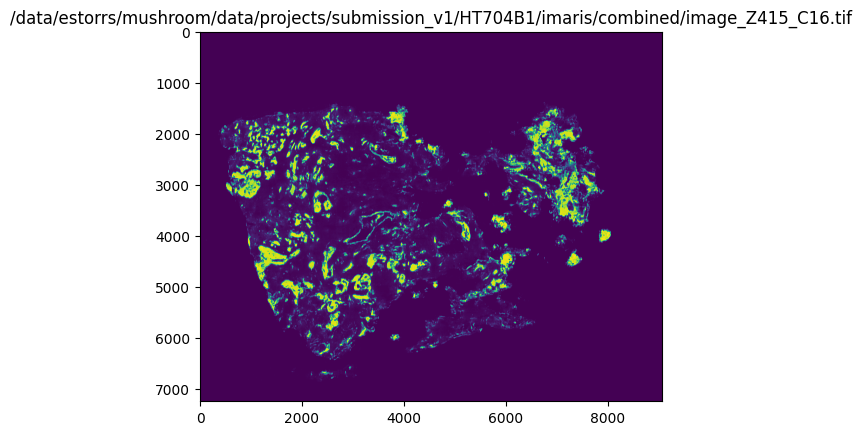

(7250, 9063)


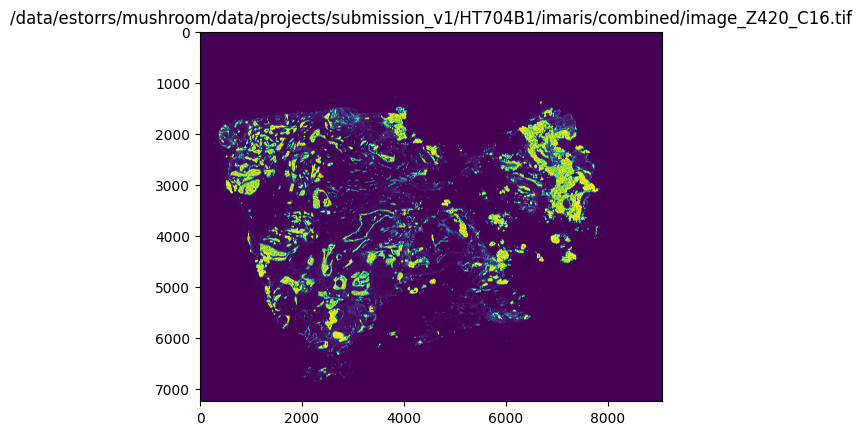

(7250, 9063)


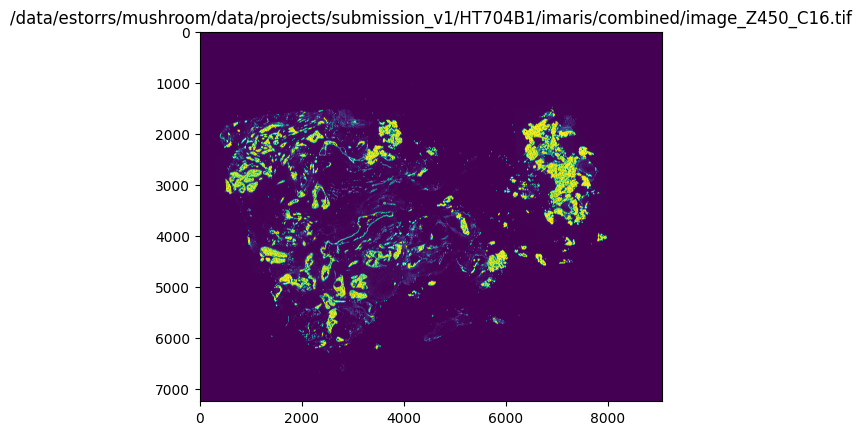

(7250, 9063)


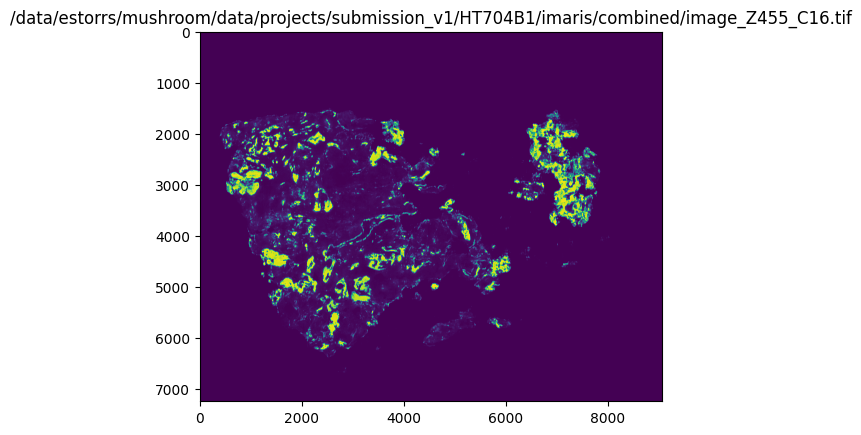

(7250, 9063)


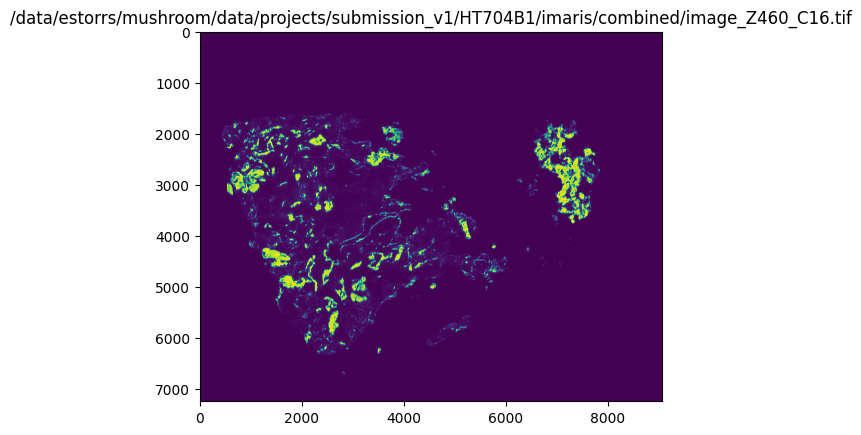

(7250, 9063)


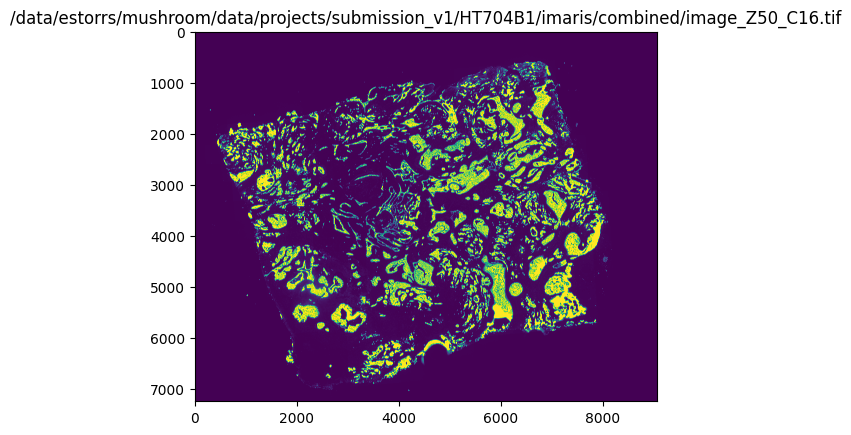

(7250, 9063)


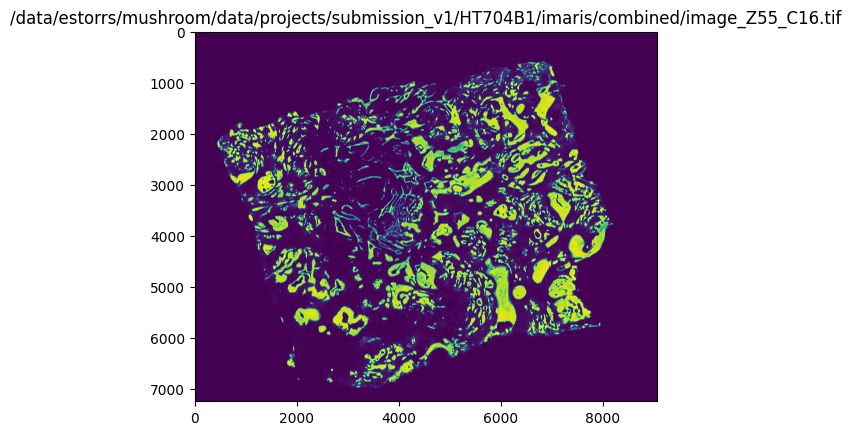

(7250, 9063)


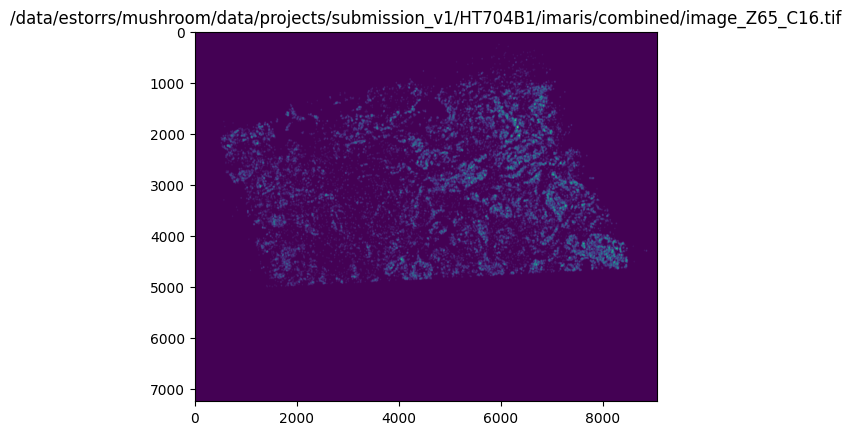

(7250, 9063)


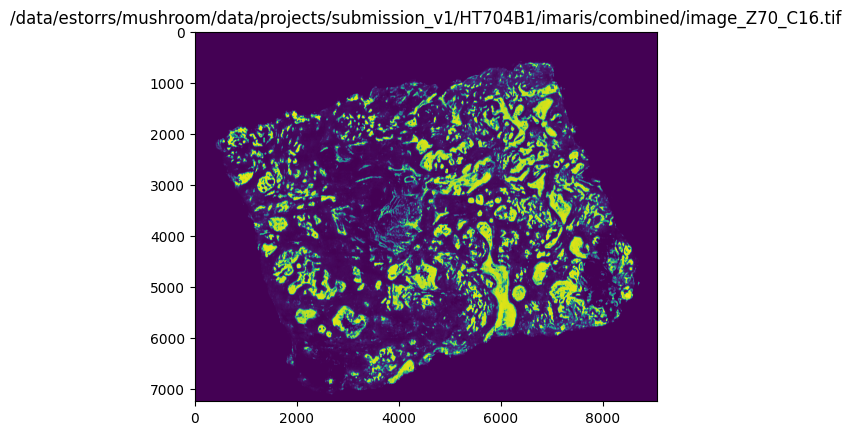

(7250, 9063)


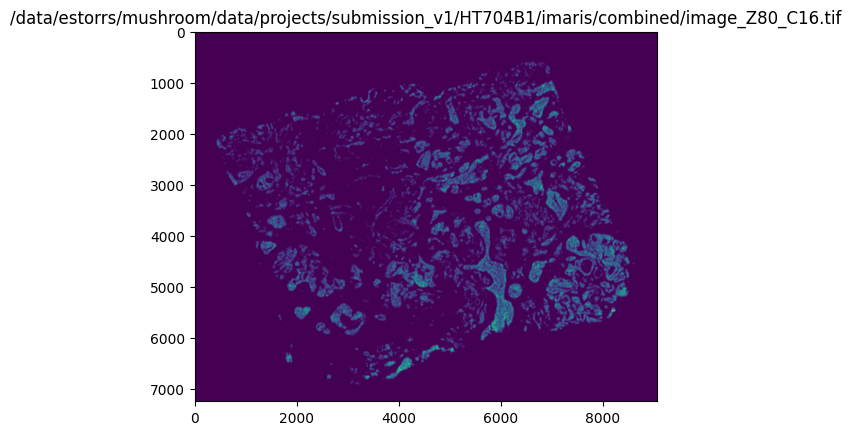

(7250, 9063)


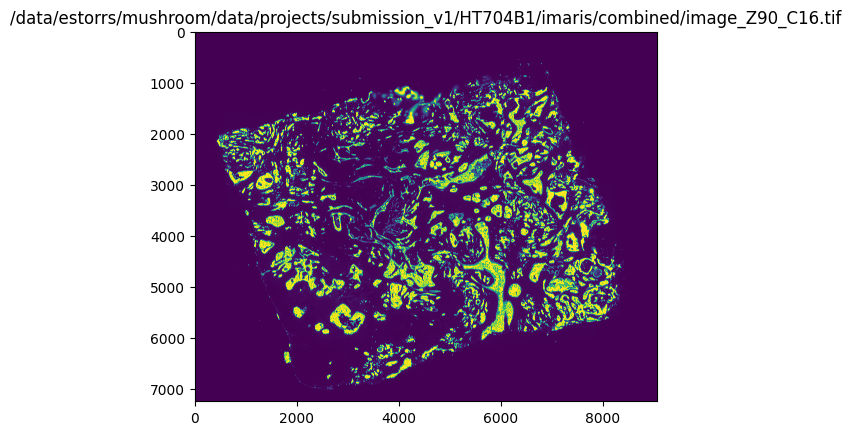

(7250, 9063)


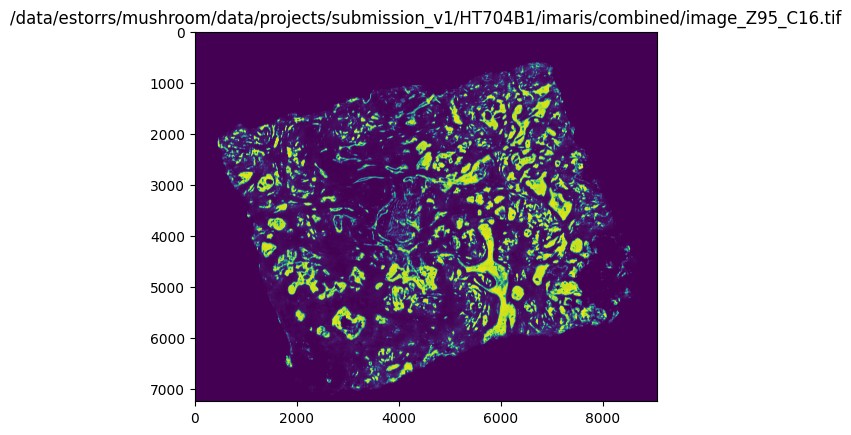

In [69]:
fps = sorted(utils.listfiles(combined_dir, regex=r'tif$'))
for fp in fps:
    if 'C16.tif' in fp:
        x = tifffile.imread(fp)
        print(x.shape)
        plt.imshow(x)
        plt.title(fp)
        plt.show()

In [50]:
# save an altered directory just in case
altered_dir = Path('/data/estorrs/mushroom/data/projects/submission_v1/HT704B1/imaris/combined_stacked')
altered_dir.mkdir(parents=True, exist_ok=True)

fps = sorted(utils.listfiles(combined_dir))
for fp in fps:
    
    if 'metadata' not in fp:
        name = fp.split('/')[-1]
        position = int(re.sub(r'^.*Z([0-9]+).*$', r'\1', name))
        idx = z_to_idx[position]
        new_name = name.replace(f'Z{position}', f'Z{idx}')
        
        save_fp = altered_dir / new_name
        shutil.copy(fp, save_fp)


In [20]:
import shutil
shutil.rmtree(combined_dir)

In [ ]:
# fix predicted tiling
# blur xenium and cosmx